In [47]:
import sys
import rhkpy

import matplotlib.pyplot as pl
import numpy as np
import xarray as xr

filename_map = 'Scan__0051.sm4'
specmap = rhkpy.rhkdata(filename_map)


ValueError: cannot reshape array of size 179648 into shape (401,newaxis,6)

Note: you may need to restart the kernel to use updated packages.


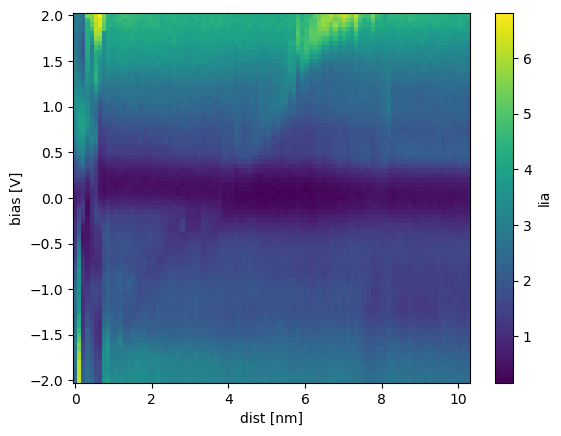

In [25]:
specmap.spectra

<xarray.Dataset> Size: 252kB
Dimensions:      (bias: 81, dist: 96, repetitions: 1, biasscandir: 2)
Coordinates:
  * bias         (bias) float64 648B 2.0 1.95 1.9 1.85 ... -1.85 -1.9 -1.95 -2.0
  * dist         (dist) float64 768B 0.0 0.1078 0.2156 ... 10.03 10.13 10.24
  * repetitions  (repetitions) int64 8B 0
  * biasscandir  (biasscandir) <U5 40B 'left' 'right'
Data variables:
    lia          (bias, dist, repetitions, biasscandir) float64 124kB 2.987 ....
    current      (bias, dist, repetitions, biasscandir) float64 124kB 103.2 ....
    x            (dist) float64 768B 48.52 48.52 48.58 ... 52.43 52.43 52.49
    y            (dist) float64 768B -168.0 -168.0 -168.1 ... -177.3 -177.4
Attributes: (12/15)
    filename:           Scan__0072.sm4
    bias:               2.0
    bias units:         V
    setpoint:           100.0000013351432
    setpoint units:     pA
    measurement date:   05/09/25
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       839.0
    LI frequency unit:  Hz
    LI phase:           136.0475275
    datatype:           line
    spectype:           iv

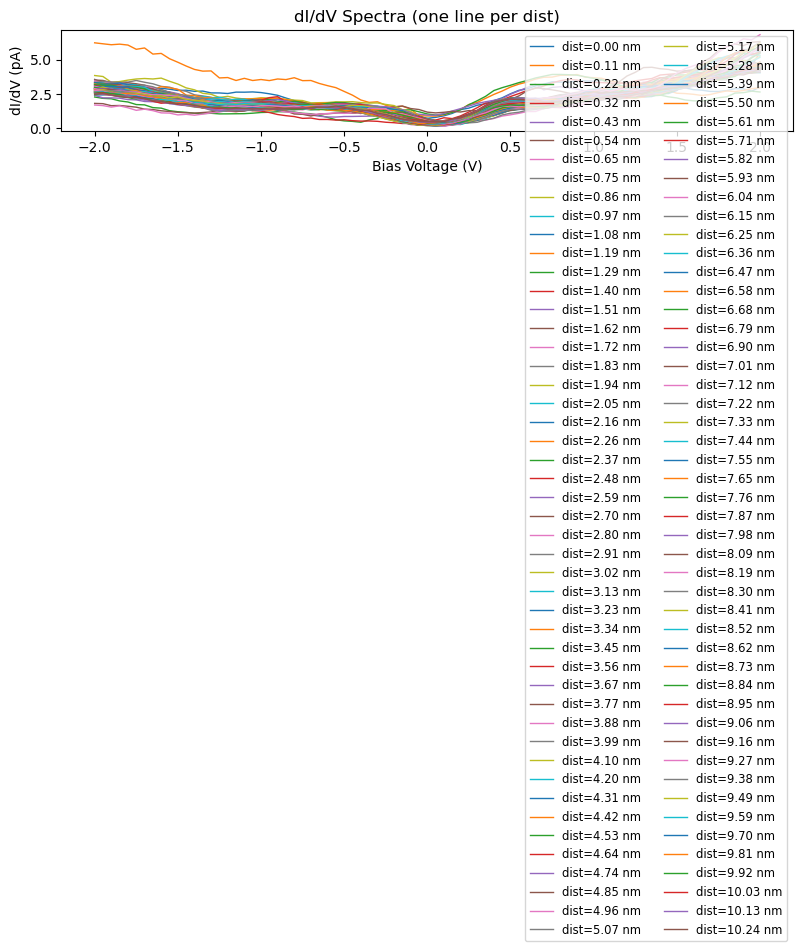

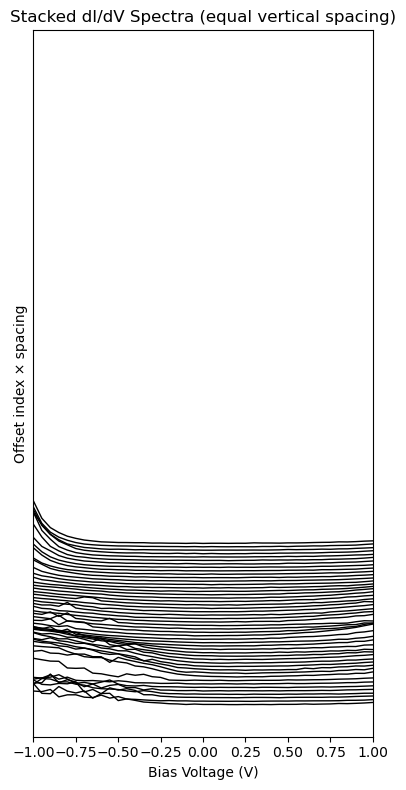

In [45]:
import rhkpy
import matplotlib.pyplot as plt

# 1. Load the SM4 file and average over repeats & scan direction
specmap     = rhkpy.rhkdata('Scan__0209.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # dims ('bias', 'dist')

# 2. Determine how many traces and choose a constant vertical spacing
n_traces = dv.sizes['dist']
spacing  = 1.0   # vertical spacing between adjacent lines, in the same units as dI/dV

# 3. Create a tall, narrow figure to “flatten” the x-axis and stretch the y-axis
fig, ax = plt.subplots(figsize=(4, 8))

# 4. Plot each spectrum with equal vertical offsets
for i in range(n_traces):
    spec   = dv.isel(dist=i)        # DataArray over bias
    offset = i * spacing
    ax.plot(
        spec.coords['bias'].values,
        spec.values + offset,
        color='black',
        linewidth=1
    )

# 5. Restrict the x-axis to the desired range [-1, 1]
ax.set_xlim(-1.0, 1.0)

# 6. Tidy up
ax.set_xlabel('Bias Voltage (V)')
ax.set_ylabel('Offset index × spacing')
ax.set_title('Stacked dI/dV Spectra (equal vertical spacing)')
ax.set_yticks([])     # hide numeric y-ticks for clarity
ax.set_aspect('auto') # allow free aspect ratio

plt.tight_layout()
plt.show()


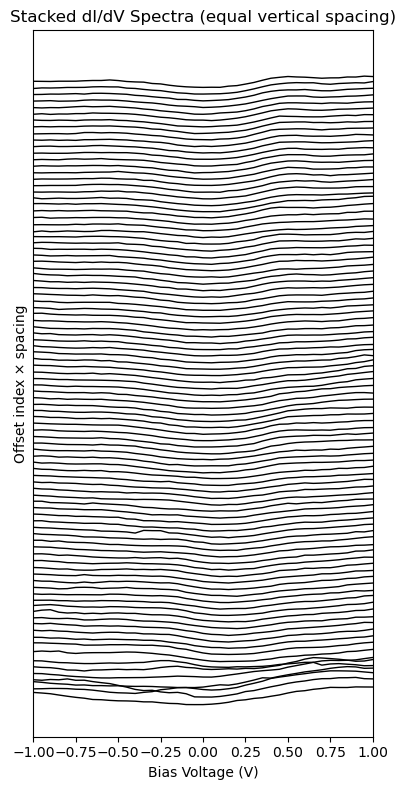

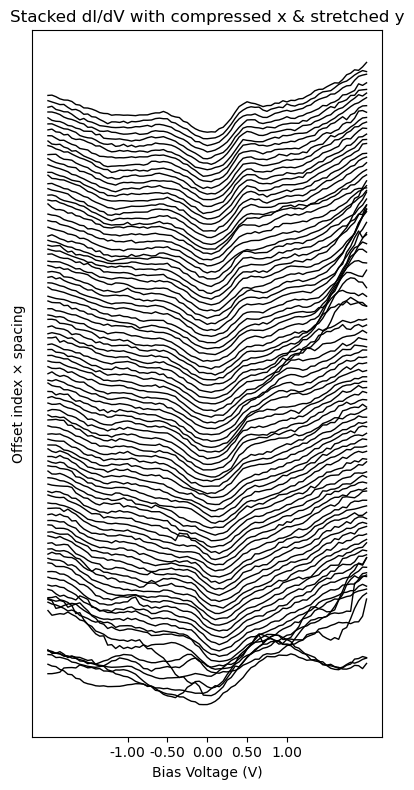

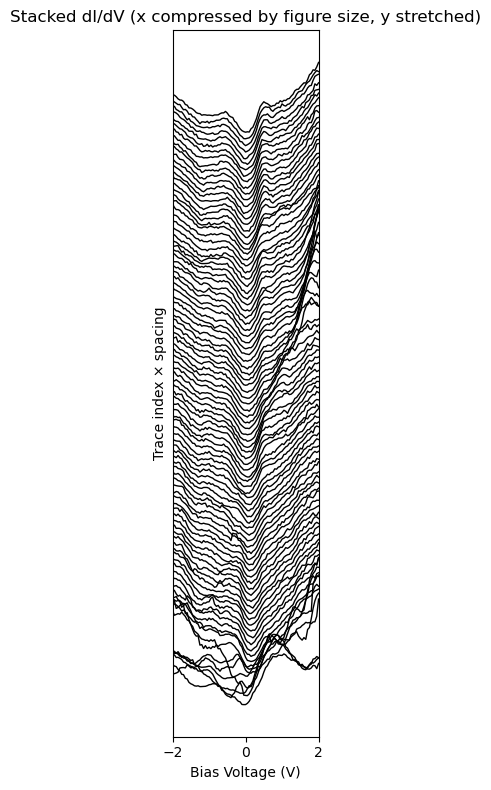

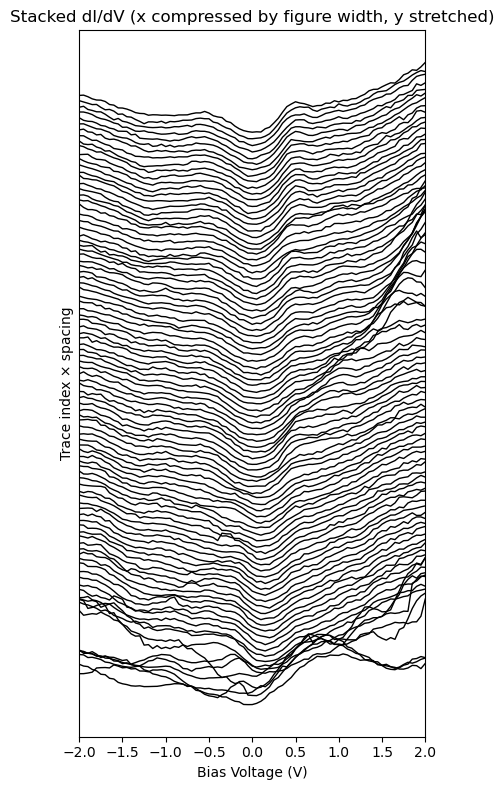

In [147]:
import rhkpy
import xarray as xr

# 修改成你的文件名
filename = 'Scan__0137.sm4'

# 1. 加载数据，不强制 repetitions 参数，让 rhkpy 自动检测
specmap = rhkpy.rhkdata(filename)

# 2. 打印 specmap 对象简要信息
print(f"=== specmap 对象 ===\n{specmap}\n")

# 3. 打印 spectra DataArray 详细信息
da = specmap.spectra
print("=== specmap.spectra DataArray ===")
print(da)
print()

# 4. 列出所有维度及对应大小
print("=== 维度和大小 ===")
for dim, size in da.sizes.items():
    print(f"  • {dim}: {size}")
print()

# 5. 列出所有坐标及其前几个值
print("=== 坐标 (前 10 个值) ===")
for coord in da.coords:
    vals = da.coords[coord].values
    preview = vals if len(vals) <= 10 else vals[:10]
    print(f"  • {coord} ({len(vals)} 个): {preview}")
print()

# 6. 专门提示 biasscandir / repetitions 这两维度
for special in ('biasscandir', 'repetitions'):
    if special in da.sizes:
        print(f"注意：检测到维度 '{special}'，大小 = {da.sizes[special]}")


=== specmap 对象 ===

=== specmap.spectra DataArray ===
<xarray.Dataset> Size: 517kB
Dimensions:      (bias: 401, dist: 20, repetitions: 2, biasscandir: 2)
Coordinates:
  * bias         (bias) float64 3kB 2.0 1.99 1.98 1.97 ... -1.98 -1.99 -2.0
  * dist         (dist) float64 160B 0.0 0.5273 1.055 ... 8.965 9.492 10.02
  * repetitions  (repetitions) int64 16B 0 1
  * biasscandir  (biasscandir) <U5 40B 'left' 'right'
Data variables:
    lia          (bias, dist, repetitions, biasscandir) float64 257kB 0.9834 ...
    current      (bias, dist, repetitions, biasscandir) float64 257kB 99.7 .....
    x            (dist) float64 160B -18.67 -18.67 -18.04 ... -9.735 -9.097
    y            (dist) float64 160B 5.7 5.7 5.896 6.092 ... 8.251 8.447 8.644
Attributes: (12/15)
    filename:           Scan__0137.sm4
    bias:               2.0
    bias units:         V
    setpoint:           99.99999439624929
    setpoint units:     pA
    measurement date:   07/24/25
    ...                 ...
    LI

In [149]:
import rhkpy
import pprint

# —— 修改成你的文件名 —— 
filename = 'Scan__0137.sm4'

# 1) 载入数据，让 rhkpy 自动识别所有维度
specmap = rhkpy.rhkdata(filename)

# 2) 打印 header（文件头）信息
print("=== specmap.header ===")
pprint.pprint(specmap.header)
print()

# 3) 打印 Dataset 级别的 attrs（看看还有哪些测量属性）
print("=== specmap.attrs ===")
pprint.pprint(specmap.attrs)
print()

# 4) 打印 spectra DataArray 里的 attrs（额外确认一下测量类型、单位等） 
da = specmap.spectra
print("=== specmap.spectra.attrs ===")
pprint.pprint(da.attrs)
print()

# 5) 如果想顺便看一眼刚才的维度信息，也可以再确认一遍
print("=== 维度 ===")
for dim, sz in da.sizes.items():
    print(f"  {dim}: {sz}")


=== specmap.header ===


AttributeError: 'rhkdata' object has no attribute 'header'

In [151]:
import rhkpy
import pprint

# —— 改成你的文件名 —— 
filename = 'Scan__0137.sm4'
specmap  = rhkpy.rhkdata(filename)

# 1) 列出 specmap 对象所有非私有属性
print("=== specmap 可访问属性 (dir) ===")
attrs = [a for a in dir(specmap) if not a.startswith('_')]
pprint.pprint(attrs)
print()

# 2) 打印 specmap.__dict__，看内部存了哪些信息
print("=== specmap.__dict__ ===")
pprint.pprint(specmap.__dict__, compact=False)
print()

# 3) 如果 specmap 有 attrs、metadata、raw_header 之类属性，也分别打印
for name in ('attrs', 'metadata', 'raw_header'):
    if hasattr(specmap, name):
        print(f"=== specmap.{name} ===")
        pprint.pprint(getattr(specmap, name))
        print()

# 4) 再次打印 xarray Dataset 的 attrs
print("=== specmap.spectra.attrs ===")
pprint.pprint(specmap.spectra.attrs)
print()

# 5) 再次确认维度
print("=== specmap.spectra 维度 ===")
for k, v in specmap.spectra.sizes.items():
    print(f"  • {k}: {v}")


=== specmap 可访问属性 (dir) ===
['alternate',
 'coord_to_absolute',
 'datatype',
 'filename',
 'image',
 'loadraw',
 'mrep',
 'msw',
 'numberofspectra',
 'polyflatten',
 'print_info',
 'qplot',
 'repetitions',
 'spectra',
 'spectype',
 'spymdata']

=== specmap.__dict__ ===
{'alternate': True,
 'datatype': 'line',
 'filename': 'Scan__0137.sm4',
 'image': <xarray.Dataset> Size: 201kB
Dimensions:     (y: 512, x: 8, scandir: 2)
Coordinates:
  * y           (y) float64 4kB 0.0 0.01957 0.03914 0.05871 ... 9.961 9.98 10.0
  * x           (x) float64 64B 0.0 1.252 2.505 3.757 5.01 6.262 7.515 8.767
  * scandir     (scandir) <U8 64B 'forward' 'backward'
Data variables:
    topography  (y, x, scandir) float64 66kB 0.002003 -0.0001543 ... 0.0008128
    current     (y, x, scandir) float64 66kB 98.67 99.62 98.27 ... 99.51 99.79
    lia         (y, x, scandir) float64 66kB 2.148 2.416 ... -0.1763 -0.5272
Attributes: (12/14)
    filename:          Scan__0137.sm4
    xoffset:           -18.88559652586663


In [153]:
import rhkpy
import numpy as np

# —— 改成你的文件名 —— 
filename = 'Scan__0137.sm4'
specmap  = rhkpy.rhkdata(filename)

# 1) 查看各维度大小
n_dist       = specmap.spectra.sizes['dist']
n_reps       = specmap.spectra.sizes['repetitions']
n_dir        = specmap.spectra.sizes['biasscandir']
total_curves = n_dist * n_reps * n_dir

print(f"空间点数 (dist)          = {n_dist}")
print(f"重复次数 (repetitions)    = {n_reps}")
print(f"扫描方向 (biasscandir)   = {n_dir}")
print(f"总曲线数                 = {total_curves}")

# 2) 打印空间坐标和相邻点间距（nm）
d_coords = specmap.spectra.coords['dist'].values
print("\ndist 坐标前 10 个值 (nm)  =", d_coords[:10])
print("前 10 段距离间隔 (nm)    =", np.round(np.diff(d_coords[:11]), 4))

# 3) 如果你只是想取前 16 个点，再平均掉重复和方向，可以这样： 
dv = specmap.spectra['lia'].mean(dim=['repetitions','biasscandir'])
dv16 = dv.isel(dist=slice(0,16))
print(f"\n平均并截取前 16 点后，剩余 trace 数 = {dv16.sizes['dist']}")


空间点数 (dist)          = 20
重复次数 (repetitions)    = 2
扫描方向 (biasscandir)   = 2
总曲线数                 = 80

dist 坐标前 10 个值 (nm)  = [0.        0.5273456 1.0546912 1.5820368 2.1093824 2.636728  3.1640736
 3.6914192 4.2187648 4.7461104]
前 10 段距离间隔 (nm)    = [0.5273 0.5273 0.5273 0.5273 0.5273 0.5273 0.5273 0.5273 0.5273 0.5273]

平均并截取前 16 点后，剩余 trace 数 = 16


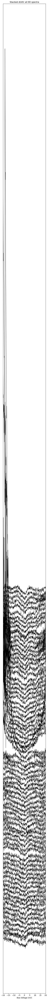

In [157]:
import rhkpy
import matplotlib.pyplot as plt

# —— 改成你的文件路径 —— 
filename = 'Scan__0137.sm4'
specmap  = rhkpy.rhkdata(filename)
da       = specmap.spectra['lia']

# 1) 按 dist→repetitions→biasscandir 的顺序展开
da_flat = (
    da
    .transpose('bias', 'dist', 'repetitions', 'biasscandir')
    .stack(scan=('dist', 'repetitions', 'biasscandir'))
    .transpose('bias', 'scan')
)
n_traces = da_flat.sizes['scan']

# 2) 绘图参数
spacing        = 1.0   # 垂直偏移
vertical_scale = 5.0   # 信号放大

# 3) 绘制所有光谱
fig, ax = plt.subplots(figsize=(4, n_traces * spacing))
for i in range(n_traces):
    spec   = da_flat.isel(scan=i)
    bias_mV = spec.coords['bias'].values * 1000 / 100
    y       = spec.values * vertical_scale + i * spacing
    ax.plot(bias_mV, y, 'k-', lw=1)

ax.set_xlim(-20, 20)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_yticks([])
ax.set_title(f'Stacked dI/dV: all {n_traces} spectra')
plt.tight_layout()
plt.show()


已保存分组平均谱图到: Scan__0185/Scan__0185_grouped_avg.png


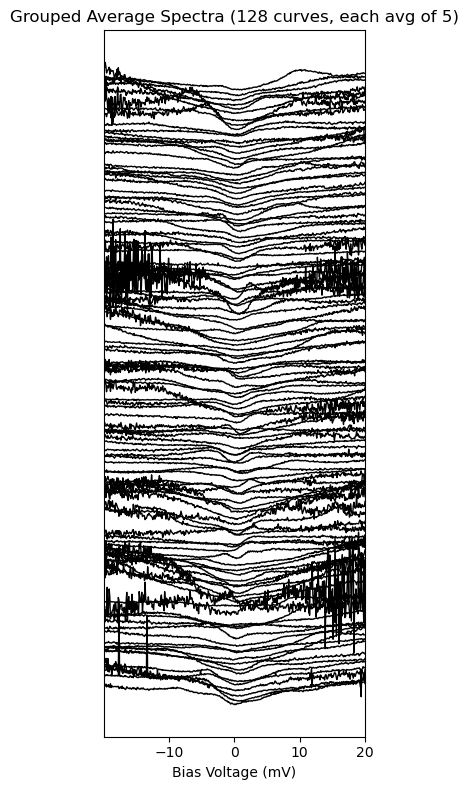

In [331]:
# 完整通用代码：按用户指定分组大小对 Line Spectroscopy 数据分组平均并绘制
# 如果还未安装 rhkpy，请先取消并运行：
# !pip install rhkpy

import os
from pathlib import Path
import rhkpy
import numpy as np
import matplotlib.pyplot as plt

# —— 用户配置 —— 
filename   = 'Scan__0185.sm4'   # 修改为你的文件名
group_size = 5                  # 手动指定每组包含的谱数量

# —— 加载并展开数据 —— 
specmap = rhkpy.rhkdata(filename)
da      = specmap.spectra['lia']  # 使用 LIA 通道，如需使用 current 可改为 'current'

# 按 (bias, dist, repetitions, biasscandir) 顺序展开到 (bias, scan)
da_flat = (
    da
    .transpose('bias','dist','repetitions','biasscandir')
    .stack(scan=('dist','repetitions','biasscandir'))
    .transpose('bias','scan')
)

# —— 准备数组 —— 
bias_mV     = da_flat.coords['bias'].values * 1000 / 100  # ±2 V → ±20 mV
data        = da_flat.values.T                           # shape = (total_scans, n_bias)
total_scans, n_bias = data.shape

# —— 检查分组可行性 —— 
if total_scans % group_size != 0:
    raise ValueError(f"总扫描数 {total_scans} 不能被 group_size {group_size} 整除，请检查参数。")

n_groups     = total_scans // group_size
# reshape 为 (n_groups, group_size, n_bias)，再沿组内平均
data_grouped = data.reshape(n_groups, group_size, n_bias).mean(axis=1)  # shape = (n_groups, n_bias)

# —— 绘制分组平均光谱 —— 
spacing        = 1.0   # 组间垂直偏移
vertical_scale = 3.0   # 信号放大倍数

fig, ax = plt.subplots(figsize=(3,8))
for i in range(4,n_groups):
    y = data_grouped[i] * vertical_scale + i * spacing
    ax.plot(bias_mV, y, 'k-', linewidth=1)

ax.set_xlim(bias_mV.min(), bias_mV.max())
ax.set_xlabel('Bias Voltage (mV)')
ax.set_yticks([])
ax.set_title(f'Grouped Average Spectra ({n_groups} curves, each avg of {group_size})')
plt.tight_layout()

# —— 保存结果 —— 
outdir = Path(filename).stem
outdir = Path(outdir)               # 确保 outdir 是 pathlib.Path 对象
outdir.mkdir(exist_ok=True)
outpath = outdir / f'{Path(filename).stem}_grouped_avg.png'
fig.savefig(outpath, dpi=300)
print(f"已保存分组平均谱图到: {outpath}")

plt.show()


已保存谱图到: Scan__0185/Scan__0185_grouped_peaks.png
已保存 peak 位置到: Scan__0185/Scan__0185_peak_positions.csv


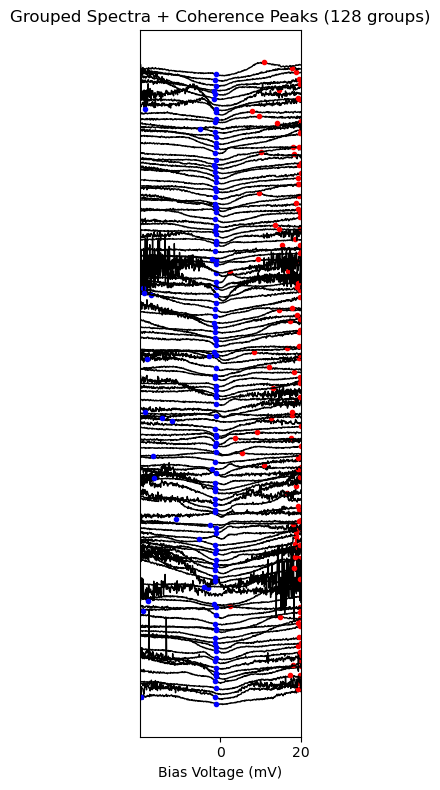

In [39]:
import os
from pathlib import Path
import rhkpy
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# —— 用户配置 —— 
filename   = 'Scan__0185.sm4'   # 修改为你的文件名
group_size = 5                  # 每组包含的谱数量
spacing    = 1.0                # 组间垂直偏移
vertical_scale = 2.0            # 信号放大倍数
start_idx  = 0                  # 从哪组开始画图和找 peak

# —— 加载并展开数据 —— 
specmap = rhkpy.rhkdata(filename)
da      = specmap.spectra['lia']  # 或 'current'

da_flat = (
    da
    .transpose('bias','dist','repetitions','biasscandir')
    .stack(scan=('dist','repetitions','biasscandir'))
    .transpose('bias','scan')
)

bias_mV     = da_flat.coords['bias'].values * 1000 / 100
data        = da_flat.values.T
total_scans, n_bias = data.shape

# —— 分组平均 —— 
if total_scans % group_size != 0:
    raise ValueError(f"总扫描数 {total_scans} 不能被 group_size {group_size} 整除")

n_groups     = total_scans // group_size
data_grouped = data.reshape(n_groups, group_size, n_bias).mean(axis=1)

# —— 初始化绘图 —— 
fig, ax = plt.subplots(figsize=(2, 8))

# 用于保存 peak 数据
peak_data = {
    'Group Index': [],
    'Positive Peak (mV)': [],
    'Negative Peak (mV)': []
}

# —— 遍历每组，绘图 & 找 peak —— 
for i in range(start_idx, n_groups):
    spectrum = data_grouped[i]
    y = spectrum * vertical_scale + i * spacing
    ax.plot(bias_mV, y, 'k-', linewidth=1)

    # 找正负 bias 中的峰值（最大和最小）
    pos_mask = bias_mV > 1.0   # 排除 ±1 mV 内的杂点
    neg_mask = bias_mV < -1.0

    pos_peak_idx = np.argmax(spectrum[pos_mask])
    neg_peak_idx = np.argmin(spectrum[neg_mask])

    pos_peak_bias = bias_mV[pos_mask][pos_peak_idx]
    neg_peak_bias = bias_mV[neg_mask][neg_peak_idx]
    pos_peak_val  = spectrum[pos_mask][pos_peak_idx] * vertical_scale + i * spacing
    neg_peak_val  = spectrum[neg_mask][neg_peak_idx] * vertical_scale + i * spacing

    ax.plot(pos_peak_bias, pos_peak_val, 'ro', markersize=3)
    ax.plot(neg_peak_bias, neg_peak_val, 'bo', markersize=3)

    peak_data['Group Index'].append(i)
    peak_data['Positive Peak (mV)'].append(pos_peak_bias)
    peak_data['Negative Peak (mV)'].append(neg_peak_bias)

# —— 图像设置 —— 
ax.set_xlim(bias_mV.min(), bias_mV.max())
ax.set_xlabel('Bias Voltage (mV)')
ax.set_yticks([])
ax.set_title(f'Grouped Spectra + Coherence Peaks ({n_groups} groups)')
plt.tight_layout()

# —— 保存图像和 peak 数据 —— 
outdir = Path(filename).stem
Path(outdir).mkdir(exist_ok=True)

figpath = Path(outdir) / f'{Path(filename).stem}_grouped_peaks.png'
fig.savefig(figpath, dpi=300)
print(f"已保存谱图到: {figpath}")

peak_df = pd.DataFrame(peak_data)
csvpath = Path(outdir) / f'{Path(filename).stem}_peak_positions.csv'
peak_df.to_csv(csvpath, index=False)
print(f"已保存 peak 位置到: {csvpath}")

plt.show()


已保存图片到: Scan__0185/Scan__0185_avg_-20_20mV_sigma0.0_scale1.0.png


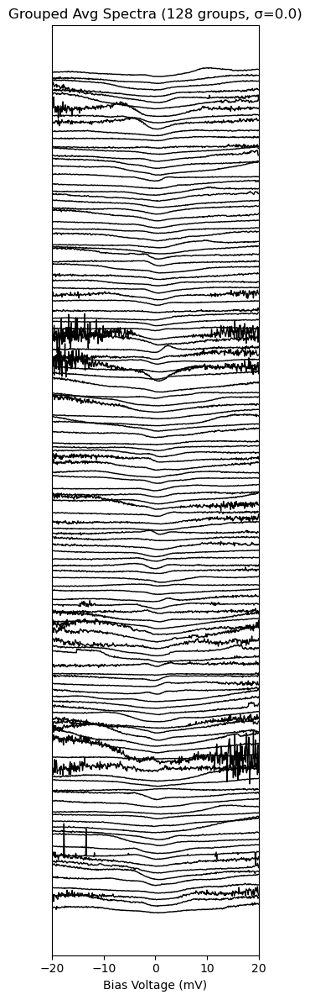

In [327]:
import os
from pathlib import Path
import rhkpy
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# —— 用户配置 —— 
filename        = 'Scan__0185.sm4'   # 修改为你的文件名
group_size      = 5                  # 每组包含的谱数量
xlim_min        = -20                # 单位 mV，左边界
xlim_max        = 20                 # 单位 mV，右边界
spacing         = 1.0                # 相邻曲线的垂直偏移
start_idx       = 0                  # 从第几个分组开始画（包含）
end_idx         = None               # 到第几个分组为止（不包含），None 表示画到最后
smooth_sigma    = 0.0                # 高斯平滑强度（0 表示不平滑）
vertical_scale  = 1.0                # 放大倍数；设为 None 表示自动计算

# —— 加载并展开数据 —— 
specmap = rhkpy.rhkdata(filename)
da      = specmap.spectra['lia']  # 可改为 'current'

# 转换为二维数组：bias × scan
da_flat = (
    da
    .transpose('bias','dist','repetitions','biasscandir')
    .stack(scan=('dist','repetitions','biasscandir'))
    .transpose('bias','scan')
)

# —— 提取 bias 和数据 —— 
bias_mV     = da_flat.coords['bias'].values * 1000 / 100
data        = da_flat.values.T
total_scans, n_bias = data.shape

# —— 检查分组合法性 —— 
if total_scans % group_size != 0:
    raise ValueError(f"总扫描数 {total_scans} 不能被 group_size {group_size} 整除，请修改参数。")

n_groups     = total_scans // group_size
data_grouped = data.reshape(n_groups, group_size, n_bias).mean(axis=1)

# —— 高斯平滑（可选）—— 
if smooth_sigma > 0:
    data_grouped = gaussian_filter1d(data_grouped, sigma=smooth_sigma, axis=1)

# —— 截取 bias 范围 —— 
xmask      = (bias_mV >= xlim_min) & (bias_mV <= xlim_max)
bias_crop  = bias_mV[xmask]
data_crop  = data_grouped[:, xmask]

# —— 设置 end_idx 默认值 —— 
if end_idx is None:
    end_idx = n_groups
elif end_idx > n_groups:
    raise ValueError(f"end_idx ({end_idx}) 超过了分组总数 {n_groups}")

# —— 设置 vertical scale —— 
if vertical_scale is None:
    global_min     = np.min(data_crop[start_idx:end_idx])
    global_max     = np.max(data_crop[start_idx:end_idx])
    vertical_scale = 10.0 / (global_max - global_min)  # 自动缩放

# —— 绘图 —— 
fig, ax = plt.subplots(figsize=(3, 12))
for i in range(start_idx, end_idx):
    y = data_crop[i] * vertical_scale + i * spacing
    ax.plot(bias_crop, y, 'k-', linewidth=1)

ax.set_xlim(xlim_min, xlim_max)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_yticks([])
ax.set_title(f'Grouped Avg Spectra ({end_idx-start_idx} groups, σ={smooth_sigma})')
plt.tight_layout()

# —— 保存 —— 
outdir = Path(filename).stem
Path(outdir).mkdir(exist_ok=True)
outpath = Path(outdir) / f'{Path(filename).stem}_avg_{xlim_min}_{xlim_max}mV_sigma{smooth_sigma}_scale{vertical_scale}.png'
fig.savefig(outpath, dpi=300)
print(f"已保存图片到: {outpath}")

plt.show()


Saved original linecut plot to Scan__0185/Scan__0185_original_linecut.png


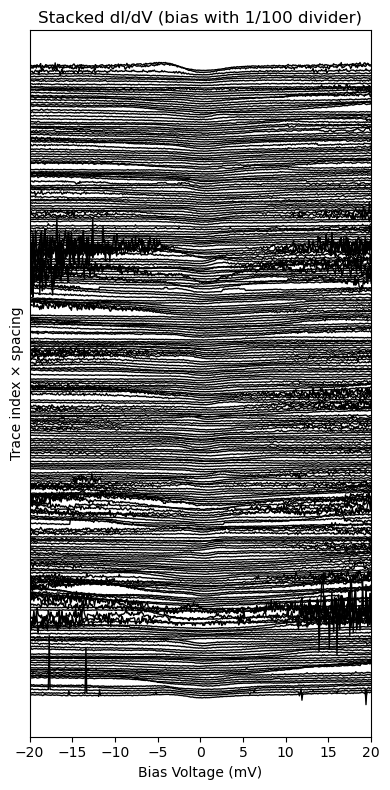

In [13]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt

# Specify input file and output folder
filename = 'Scan__0185.sm4'
base = Path(filename).stem             # "Scan__0072"
outdir = Path(base)

# Create the output directory if it doesn't exist
outdir.mkdir(parents=True, exist_ok=True)

# Load and average your data
specmap     = rhkpy.rhkdata(filename, repetitions=1)
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']      # dims ('bias','dist')

# Plot parameters
n_traces       = dv.sizes['dist']
spacing        = 1.0   # vertical offset between traces
vertical_scale = 5.0   # amplify the gap depth

# Create figure
fig, ax = plt.subplots(figsize=(4, 8))

# Plot each trace with bias converted to mV/100 (±2 V → ±20 mV)
for i in range(20,n_traces-20):
    spec   = dv.isel(dist=i)
    bias_mV = spec.coords['bias'].values * 1000 / 100
    y       = spec.values * vertical_scale + i * spacing
    ax.plot(bias_mV, y, color='black', linewidth=1)

# Format axes
ax.set_xlim(-20, 20)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Trace index × spacing')
ax.set_title('Stacked dI/dV (bias with 1/100 divider)')
ax.set_yticks([])
ax.set_aspect('auto')
plt.tight_layout()

# Save to file
outpath = outdir / f'{base}_original_linecut.png'
fig.savefig(outpath, dpi=300)
print(f"Saved original linecut plot to {outpath}")

# Display inline
plt.show()


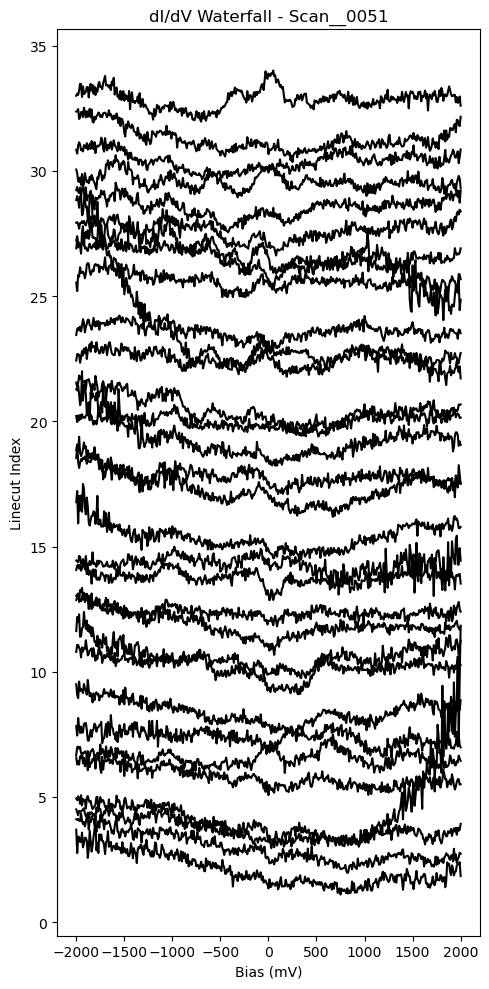

In [340]:
import rhkpy
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

filename = 'Scan__0051.sm4'
outdir = Path('output_waterfall_0051')
outdir.mkdir(exist_ok=True)

# === 强制设置重复数为 7 ===
data = rhkpy.rhkdata(filename, repetitions=7)

# === 提取 dI/dV 光谱 ===
dv = data.spectra['lia']  # shape: (bias, dist, repetitions, biasscandir)

# === 对重复谱线和扫向平均 ===
dv_avg = dv.mean(dim='repetitions').mean(dim='biasscandir')

# === 准备画图参数 ===
bias_mV = dv.coords['bias'].values * 1000  # mV
n_traces = dv.sizes['dist']
spacing = 1.0
scale = 10.0

# === 画 waterfall 图 ===
fig, ax = plt.subplots(figsize=(5, 10))
for i in range(n_traces):
    trace = dv_avg.isel(dist=i).values
    ax.plot(bias_mV, trace * scale + i * spacing, color='black')

ax.set_xlabel('Bias (mV)')
ax.set_ylabel('Linecut Index')
ax.set_title('dI/dV Waterfall - Scan__0051')
plt.tight_layout()
plt.savefig(outdir / 'waterfall_0051.png', dpi=300)
plt.show()


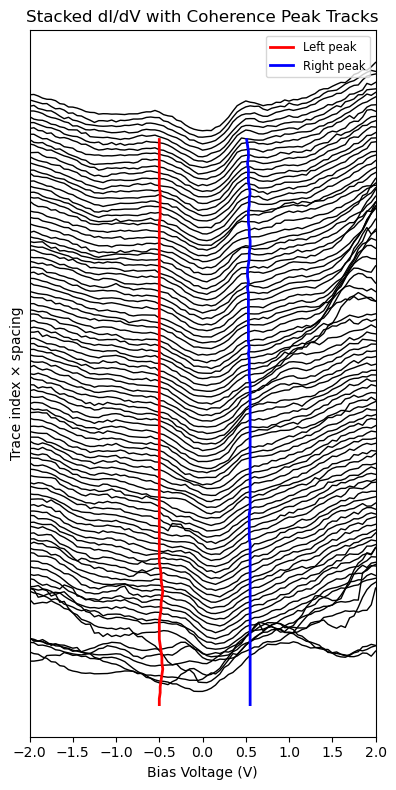

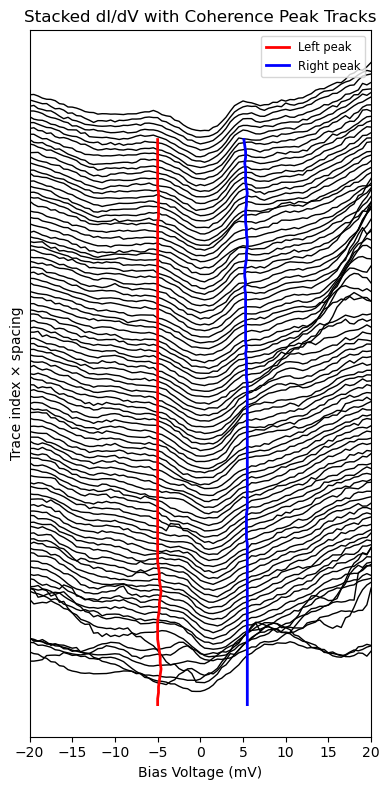

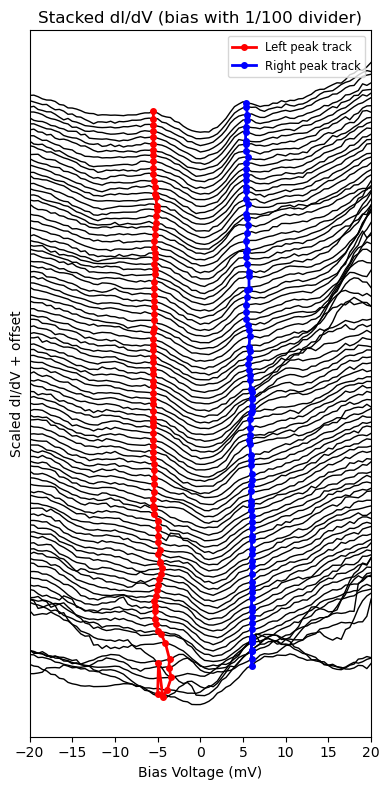

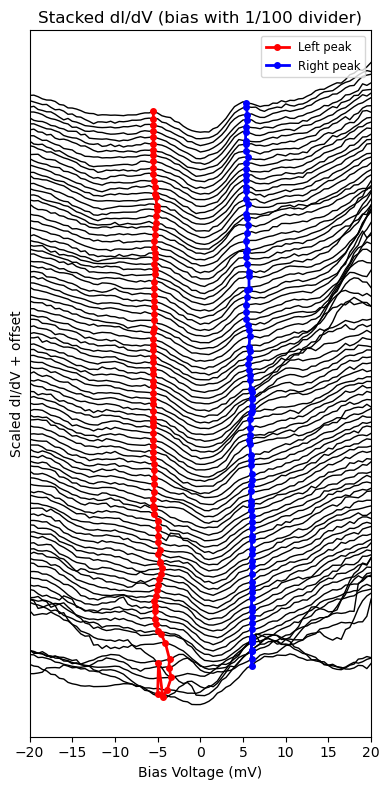

Saved plot to: Scan__0072/Scan__0072_stacked_spectra_peak_tracking.png


In [393]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d
import os

# ----------------------- 0. Setup output folder -----------------------
scan_file = 'Scan__0072.sm4'
scan_name = os.path.splitext(os.path.basename(scan_file))[0]  # 'Scan__0072'
folder    = scan_name
os.makedirs(folder, exist_ok=True)

# ----------------------- 1. Load & average your data -----------------------
specmap     = rhkpy.rhkdata(scan_file)
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # DataArray with dims ('bias','dist')

# ----------------------- 2. Parameters -----------------------
bias_vals    = dv.coords['bias'].values  # bias axis in V
n_traces     = dv.sizes['dist']          # number of spatial lines
left_window  = (-0.6, -0.3)              # search range for left peaks (V)
right_window = ( 0.3,  0.6)              # search range for right peaks (V)
smooth_win   = 5                         # smoothing window size
vscale       = 3.0                       # vertical scale factor
spacing      = 1.0                       # vertical offset between traces

# ----------------------- 3. Find raw peak positions -----------------------
left_peaks  = np.zeros(n_traces)
right_peaks = np.zeros(n_traces)
for i in range(n_traces):
    spec = dv.isel(dist=i).values
    # Left peak
    mask_l = (bias_vals >= left_window[0]) & (bias_vals <= left_window[1])
    if mask_l.any():
        idx_l = np.argmax(spec[mask_l])
        left_peaks[i] = bias_vals[mask_l][idx_l]
    # Right peak
    mask_r = (bias_vals >= right_window[0]) & (bias_vals <= right_window[1])
    if mask_r.any():
        idx_r = np.argmax(spec[mask_r])
        right_peaks[i] = bias_vals[mask_r][idx_r]

# ----------------------- 4. Smooth the peak trajectories -----------------------
left_smooth  = uniform_filter1d(left_peaks,  size=smooth_win, mode='nearest')
right_smooth = uniform_filter1d(right_peaks, size=smooth_win, mode='nearest')

# ----------------------- 5. Convert to mV (±2 V → ±20 mV) -----------------------
bias_mV_all = bias_vals * 1000 / 100
left_mV     = left_smooth  * 1000 / 100
right_mV    = right_smooth * 1000 / 100

# ----------------------- 6. Compute y-coordinates at each peak -----------------------
left_y  = np.zeros(n_traces)
right_y = np.zeros(n_traces)
for i in range(n_traces):
    spec = dv.isel(dist=i).values * vscale + i * spacing
    idx_l = np.argmin(np.abs(bias_vals - left_smooth[i]))
    idx_r = np.argmin(np.abs(bias_vals - right_smooth[i]))
    left_y[i]  = spec[idx_l]
    right_y[i] = spec[idx_r]

# ----------------------- 7. Plot stacked spectra -----------------------
fig, ax = plt.subplots(figsize=(4, 8))
for i in range(n_traces):
    offset = i * spacing
    y_vals = dv.isel(dist=i).values * vscale + offset
    ax.plot(bias_mV_all, y_vals, color='black', linewidth=1)

# ----------------------- 8. Overlay the peak trajectories -----------------------
ax.plot(left_mV,  left_y,  '-o', color='red',   linewidth=2, markersize=4, label='Left peak')
ax.plot(right_mV, right_y, '-o', color='blue',  linewidth=2, markersize=4, label='Right peak')

# ----------------------- 9. Formatting -----------------------
ax.set_xlim(-20, 20)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Scaled dI/dV + offset')
ax.set_title('Stacked dI/dV (bias with 1/100 divider)')
ax.legend(loc='upper right', fontsize='small')
ax.set_yticks([])
ax.set_aspect('auto')
plt.tight_layout()

# ----------------------- 10. Display in notebook -----------------------
plt.show()

# ----------------------- 11. Save figure -----------------------
filename = f"{scan_name}_stacked_spectra_peak_tracking.png"
filepath = os.path.join(folder, filename)
fig.savefig(filepath)
plt.close(fig)

print(f"Saved plot to: {filepath}")


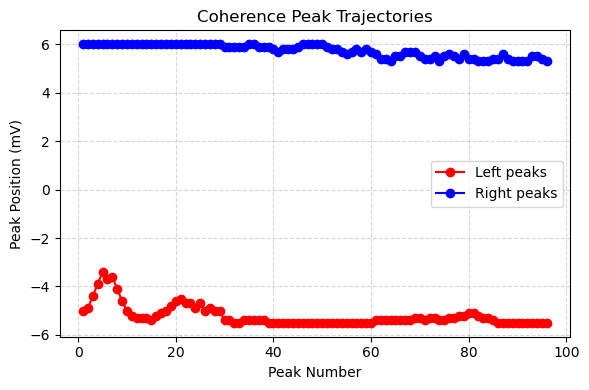

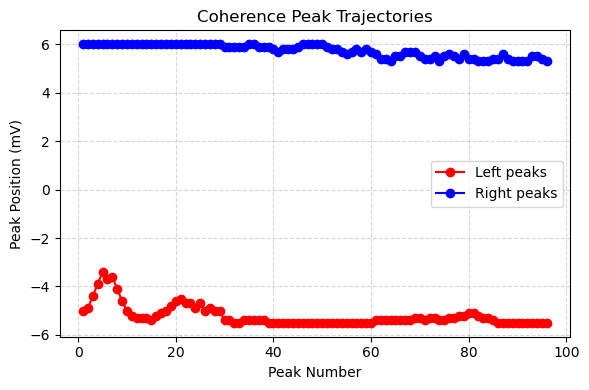

Saved coherence peak position plot to: Scan__0072/Scan__0072_peak_position.png


In [395]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d
import os

# ----------------------- 0. Setup output folder based on scan file -----------------------
scan_file = 'Scan__0072.sm4'
scan_name = os.path.splitext(os.path.basename(scan_file))[0]  # 'Scan__0072'
folder    = scan_name
os.makedirs(folder, exist_ok=True)

# ----------------------- 1. Load & average your data -----------------------
specmap     = rhkpy.rhkdata(scan_file)
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']  # DataArray with dims ('bias','dist')

# ----------------------- 2. Parameters -----------------------
bias_vals    = dv.coords['bias'].values
n_traces     = dv.sizes['dist']
left_window  = (-0.6, -0.3)
right_window = ( 0.3,  0.6)
smooth_win   = 5

# ----------------------- 3. Find raw peak positions -----------------------
left_peaks  = np.zeros(n_traces)
right_peaks = np.zeros(n_traces)
for i in range(n_traces):
    spec = dv.isel(dist=i).values
    mask_l = (bias_vals >= left_window[0]) & (bias_vals <= left_window[1])
    if mask_l.any():
        idx_l = np.argmax(spec[mask_l])
        left_peaks[i] = bias_vals[mask_l][idx_l]
    mask_r = (bias_vals >= right_window[0]) & (bias_vals <= right_window[1])
    if mask_r.any():
        idx_r = np.argmax(spec[mask_r])
        right_peaks[i] = bias_vals[mask_r][idx_r]

# ----------------------- 4. Smooth the peak trajectories -----------------------
left_smooth  = uniform_filter1d(left_peaks,  size=smooth_win, mode='nearest')
right_smooth = uniform_filter1d(right_peaks, size=smooth_win, mode='nearest')

# ----------------------- 5. Convert to mV and apply 1/100 divider (±2 V → ±20 mV) -----------------------
left_scaled  = left_smooth * 1000 / 100
right_scaled = right_smooth * 1000 / 100

# ----------------------- 6. Plot scaled peak positions vs. peak index -----------------------
indices = np.arange(1, n_traces + 1)
plt.figure(figsize=(6, 4))
plt.plot(indices, left_scaled,  '-o', color='red',   label='Left peaks')
plt.plot(indices, right_scaled, '-o', color='blue',  label='Right peaks')
plt.xlabel('Peak Number')
plt.ylabel('Peak Position (mV)')
plt.title('Coherence Peak Trajectories')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# ----------------------- 7. Save into scan_file folder and display -----------------------
filename = f"{scan_name}_peak_position.png"
filepath = os.path.join(folder, filename)
plt.savefig(filepath)
plt.show()

print(f"Saved coherence peak position plot to: {filepath}")


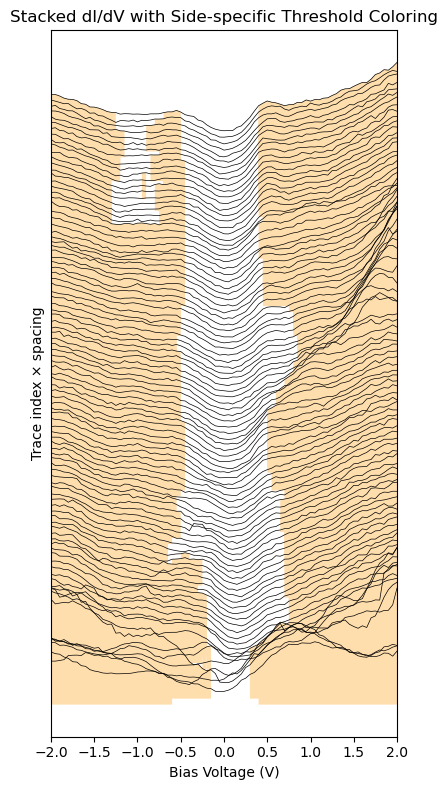

In [306]:
import rhkpy
import numpy as np
import matplotlib.pyplot as plt

# 1. Load & average your data
specmap     = rhkpy.rhkdata('Scan__0072.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # dims ('bias', 'dist')

# 2. Stack parameters
n_traces       = dv.sizes['dist']
spacing        = 1.0     # vertical offset between traces
vertical_scale = 3.0     # amplify the gap depth

# 3. Separate thresholds for left (neg) and right (pos) bias
left_thresh_low   = 0.0   # below this (|dI/dV|) on left → blue
left_thresh_high  = 1.45   # above this on left → orange
right_thresh_low  = 0.0   # below this on right → blue
right_thresh_high = 1.8   # above this on right → orange

# 4. Prepare figure
fig, ax = plt.subplots(figsize=(4, 8))

bias = dv.coords['bias'].values

# 5. Plot & fill each trace
for i in range(n_traces):
    spec = dv.isel(dist=i).values * vertical_scale
    offset = i * spacing
    y = spec + offset

    # mask left/right
    left_mask   = bias <  0
    right_mask  = bias >= 0

    # Left: fill low in blue
    ax.fill_between(
        bias, offset, y,
        where=(left_mask & (spec <= left_thresh_low*vertical_scale)),
        facecolor='lightblue', lw=0
    )
    # Left: fill high in orange
    ax.fill_between(
        bias, offset, y,
        where=(left_mask & (spec >= left_thresh_high*vertical_scale)),
        facecolor='navajowhite', lw=0
    )

    # Right: fill low in blue
    ax.fill_between(
        bias, offset, y,
        where=(right_mask & (spec <= right_thresh_low*vertical_scale)),
        facecolor='lightblue', lw=0
    )
    # Right: fill high in orange
    ax.fill_between(
        bias, offset, y,
        where=(right_mask & (spec >= right_thresh_high*vertical_scale)),
        facecolor='navajowhite', lw=0
    )

    # Draw the spectrum line
    ax.plot(bias, y, color='black', linewidth=0.5)

# 6. Finalize
ax.set_xlim(-2.0, 2.0)
ax.set_xlabel('Bias Voltage (V)')
ax.set_ylabel('Trace index × spacing')
ax.set_title('Stacked dI/dV with Side-specific Threshold Coloring')
ax.set_yticks([])
ax.set_aspect('auto')
plt.tight_layout()
plt.show()


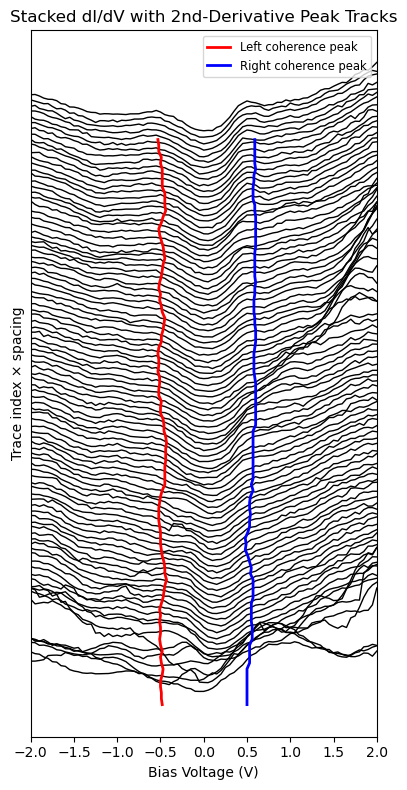

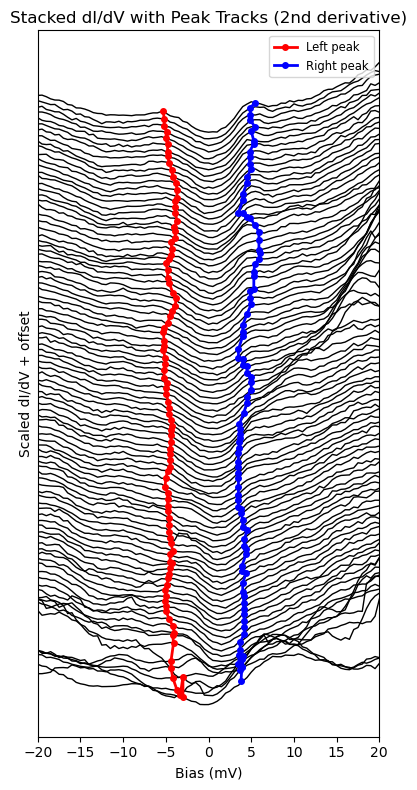

In [353]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

# 1. Load & average
specmap     = rhkpy.rhkdata('Scan__0072.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions','biasscandir'])
dv          = specmap_avg['lia']   # dims ('bias','dist')

# 2. Params
bias      = dv.coords['bias'].values   # V
n_traces  = dv.sizes['dist']
left_win  = (-0.6, -0.3)
right_win = ( 0.3,  0.6)
smooth_w  = 5
spacing   = 1.0
vscale    = 3.0

# 3. Detect peaks via 2nd derivative
left_peaks  = np.zeros(n_traces)
right_peaks = np.zeros(n_traces)
for i in range(n_traces):
    spec = dv.isel(dist=i).values
    d1   = np.gradient(spec, bias)
    d2   = np.gradient(d1, bias)
    # left minimum d2
    mL = (bias>=left_win[0]) & (bias<=left_win[1])
    if mL.any(): left_peaks[i]  = bias[mL][np.argmin(d2[mL])]
    # right maximum d2
    mR = (bias>=right_win[0]) & (bias<=right_win[1])
    if mR.any(): right_peaks[i] = bias[mR][np.argmax(d2[mR])]

# 4. Smooth
left_s  = uniform_filter1d(left_peaks,  size=smooth_w, mode='nearest')
right_s = uniform_filter1d(right_peaks, size=smooth_w, mode='nearest')

# 5. Convert bias→mV/100: ±2 V→±20 mV
bias_mV = bias * 1000 / 100
LmV     = left_s  * 1000 / 100
RmV     = right_s * 1000 / 100

# 6. Get y-positions at each peak (scaled amp + offset)
yL = np.zeros(n_traces)
yR = np.zeros(n_traces)
for i in range(n_traces):
    curve = dv.isel(dist=i).values * vscale + i*spacing
    idxL  = np.argmin(np.abs(bias - left_s[i]))
    idxR  = np.argmin(np.abs(bias - right_s[i]))
    yL[i] = curve[idxL]
    yR[i] = curve[idxR]

# 7. Plot
fig, ax = plt.subplots(figsize=(4, 8))
for i in range(n_traces):
    curve = dv.isel(dist=i).values * vscale + i*spacing
    ax.plot(bias_mV, curve, color='black', linewidth=1)

ax.plot(LmV, yL, '-o', color='red',   linewidth=2, markersize=4, label='Left peak')
ax.plot(RmV, yR, '-o', color='blue',  linewidth=2, markersize=4, label='Right peak')

ax.set_xlim(-20, 20)
ax.set_xlabel('Bias (mV)')
ax.set_ylabel('Scaled dI/dV + offset')
ax.set_title('Stacked dI/dV with Peak Tracks (2nd derivative)')
ax.legend(loc='upper right', fontsize='small')
ax.set_yticks([])
ax.set_aspect('auto')
plt.tight_layout()
plt.show()


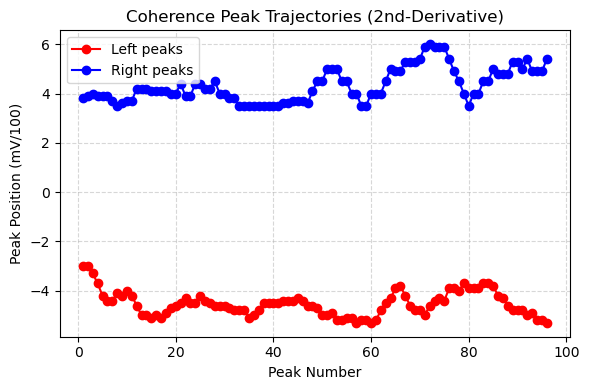

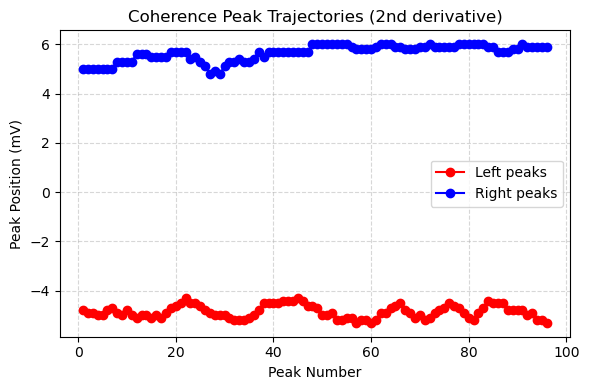

In [325]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

# 1. Load & average
specmap     = rhkpy.rhkdata('Scan__0072.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions','biasscandir'])
dv          = specmap_avg['lia']

# 2. Params
bias      = dv.coords['bias'].values   # V
n_peaks   = dv.sizes['dist']
left_win  = (-0.6, -0.4)
right_win = ( 0.4,  0.6)
smooth_w  = 5

# 3. Detect via 2nd derivative
left_p  = np.zeros(n_peaks)
right_p = np.zeros(n_peaks)
for i in range(n_peaks):
    spec = dv.isel(dist=i).values
    d1   = np.gradient(spec, bias)
    d2   = np.gradient(d1, bias)
    mL   = (bias>=left_win[0]) & (bias<=left_win[1])
    if mL.any(): left_p[i]  = bias[mL][np.argmin(d2[mL])]
    mR   = (bias>=right_win[0]) & (bias<=right_win[1])
    if mR.any(): right_p[i] = bias[mR][np.argmax(d2[mR])]

# 4. Smooth & convert to mV/100
left_s  = uniform_filter1d(left_p,  size=smooth_w, mode='nearest') * 1000/100
right_s = uniform_filter1d(right_p, size=smooth_w, mode='nearest') * 1000/100

# 5. Plot
idx = np.arange(1, n_peaks+1)
plt.figure(figsize=(6,4))
plt.plot(idx, left_s,  '-o', color='red',  label='Left peaks')
plt.plot(idx, right_s, '-o', color='blue', label='Right peaks')
plt.xlabel('Peak Number')
plt.ylabel('Peak Position (mV)')
plt.title('Coherence Peak Trajectories (2nd derivative)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


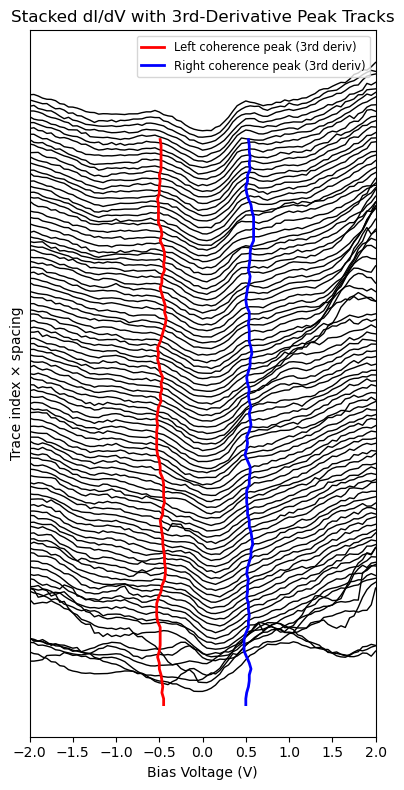

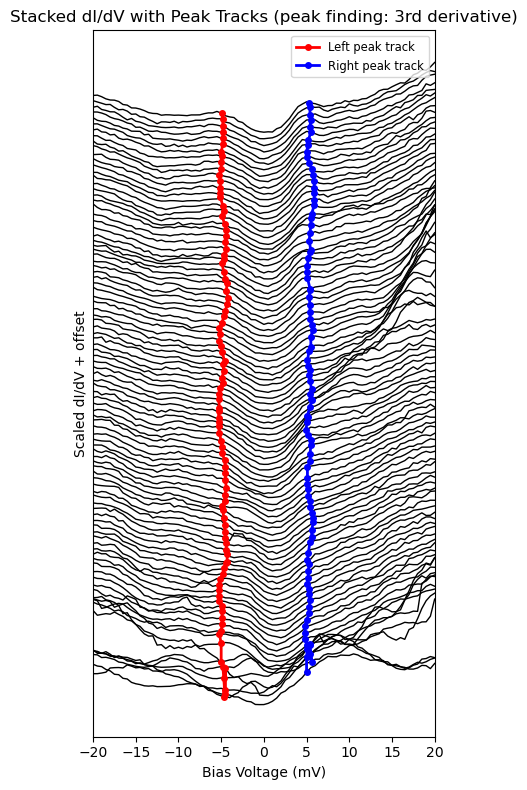

In [369]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

# 1. Load and average the data
specmap     = rhkpy.rhkdata('Scan__0072.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # DataArray with dims ('bias','dist')

# 2. Extract coordinates and set parameters
bias_vals    = dv.coords['bias'].values  # bias axis in V
n_traces     = dv.sizes['dist']          # number of spatial lines
left_win     = (-0.6, -0.4)              # V-range for left coherence peaks
right_win    = ( 0.4,  0.6)              # V-range for right coherence peaks
smooth_win   = 5                         # smoothing window size
spacing      = 1.0                       # vertical offset between traces
vscale       = 3.0                       # vertical scale factor for visibility

# 3. Detect raw bias positions of coherence peaks via 3rd derivative
left_peaks  = np.zeros(n_traces)
right_peaks = np.zeros(n_traces)
for i in range(n_traces):
    spec = dv.isel(dist=i).values
    d1   = np.gradient(spec, bias_vals)
    d2   = np.gradient(d1, bias_vals)
    d3   = np.gradient(d2, bias_vals)
    # left peak: max |d3| in left window
    mL = (bias_vals >= left_win[0]) & (bias_vals <= left_win[1])
    if mL.any():
        left_peaks[i] = bias_vals[mL][np.argmax(np.abs(d3[mL]))]
    # right peak: max |d3| in right window
    mR = (bias_vals >= right_win[0]) & (bias_vals <= right_win[1])
    if mR.any():
        right_peaks[i] = bias_vals[mR][np.argmax(np.abs(d3[mR]))]

# 4. Smooth the peak bias positions
left_smooth  = uniform_filter1d(left_peaks,  size=smooth_win, mode='nearest')
right_smooth = uniform_filter1d(right_peaks, size=smooth_win, mode='nearest')

# 5. Convert bias to mV and apply 1/100 divider (±2 V → ±20 mV)
bias_mV_all  = bias_vals * 1000 / 100
left_mV      = left_smooth  * 1000 / 100
right_mV     = right_smooth * 1000 / 100

# 6. Compute y-coordinates = actual scaled amplitude + offset at each peak
left_y  = np.zeros(n_traces)
right_y = np.zeros(n_traces)
for i in range(n_traces):
    spec_scaled = dv.isel(dist=i).values * vscale + i * spacing
    idx_l = np.argmin(np.abs(bias_vals - left_smooth[i]))
    idx_r = np.argmin(np.abs(bias_vals - right_smooth[i]))
    left_y[i]  = spec_scaled[idx_l]
    right_y[i] = spec_scaled[idx_r]

# 7. Plot stacked spectra
fig, ax = plt.subplots(figsize=(4, 8))
for i in range(n_traces):
    spec_scaled = dv.isel(dist=i).values * vscale + i * spacing
    ax.plot(bias_mV_all, spec_scaled, color='black', linewidth=1)

# 8. Overlay the coherence peak tracks at their true heights
ax.plot(left_mV,  left_y,  '-o', color='red',   linewidth=2, markersize=4, label='Left peak track')
ax.plot(right_mV, right_y, '-o', color='blue',  linewidth=2, markersize=4, label='Right peak track')

# 9. Final formatting
ax.set_xlim(-20, 20)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Scaled dI/dV + offset')
ax.set_title('Stacked dI/dV with Peak Tracks (peak finding: 3rd derivative)')
ax.legend(loc='upper right', fontsize='small')
ax.set_yticks([])  # hide y-axis ticks
ax.set_aspect('auto')

plt.tight_layout()
plt.show()


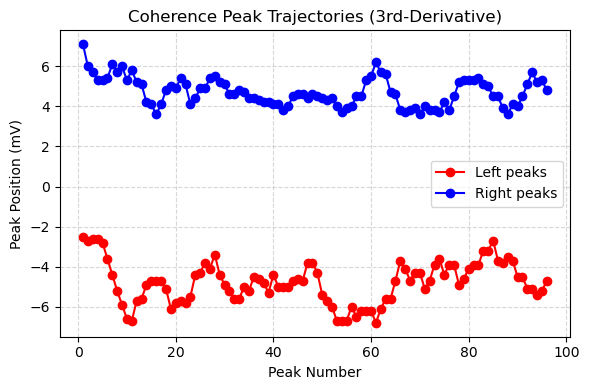

In [363]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

# 1. Load and average your data
specmap     = rhkpy.rhkdata('Scan__0072.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # DataArray with dims ('bias','dist')

# 2. Extract coordinates and set parameters
bias       = dv.coords['bias'].values     # bias axis (V)
n_traces   = dv.sizes['dist']             # number of spatial lines
left_win   = (-0.8, -0.2)                 # search range for left peak (V)
right_win  = ( 0.2,  0.8)                 # search range for right peak (V)
smooth_win = 5                            # smoothing window size

# 3. Prepare arrays to hold peak positions
left_peaks  = np.zeros(n_traces)
right_peaks = np.zeros(n_traces)

# 4. Compute 3rd derivative and locate peaks in each line
for i in range(n_traces):
    spec = dv.isel(dist=i).values
    d1   = np.gradient(spec, bias)
    d2   = np.gradient(d1, bias)
    d3   = np.gradient(d2, bias)
    
    # left coherence peak: max |d3| in left window
    mask_l = (bias >= left_win[0]) & (bias <= left_win[1])
    if mask_l.any():
        idx = np.argmax(np.abs(d3[mask_l]))
        left_peaks[i] = bias[mask_l][idx]
    
    # right coherence peak: max |d3| in right window
    mask_r = (bias >= right_win[0]) & (bias <= right_win[1])
    if mask_r.any():
        idx = np.argmax(np.abs(d3[mask_r]))
        right_peaks[i] = bias[mask_r][idx]

# 5. Smooth the peak tracks
left_smooth  = uniform_filter1d(left_peaks,  size=smooth_win, mode='nearest')
right_smooth = uniform_filter1d(right_peaks, size=smooth_win, mode='nearest')

# 6. Convert to mV and scale by 1/100
left_scaled  = left_smooth * 1000 / 100
right_scaled = right_smooth * 1000 / 100

# 7. Plot trajectories: x = peak index, y = scaled peak position
indices = np.arange(1, n_traces + 1)
plt.figure(figsize=(6, 4))
plt.plot(indices, left_scaled,  '-o', color='red',   label='Left peaks')
plt.plot(indices, right_scaled, '-o', color='blue',  label='Right peaks')
plt.xlabel('Peak Number')
plt.ylabel('Peak Position (mV)')
plt.title('Coherence Peak Trajectories (3rd-Derivative)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


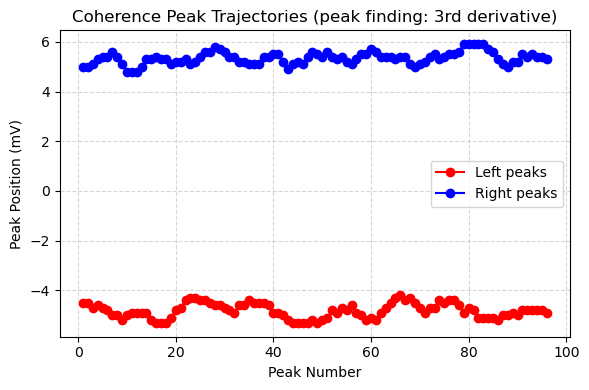

In [333]:
import numpy as np
import rhkpy
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

# 1. Load & average your data
specmap     = rhkpy.rhkdata('Scan__0072.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # DataArray with dims ('bias','dist')

# 2. Extract coordinates and set parameters
bias        = dv.coords['bias'].values  # bias axis in V
n_traces    = dv.sizes['dist']          # number of spectra
left_win    = (-0.6, -0.4)              # V-range for left peaks
right_win   = ( 0.4,  0.6)              # V-range for right peaks
smooth_win  = 5                         # smoothing window size

# 3. Detect raw peak positions via 3rd derivative
left_peaks  = np.zeros(n_traces)
right_peaks = np.zeros(n_traces)
for i in range(n_traces):
    spec = dv.isel(dist=i).values
    d1   = np.gradient(spec, bias)
    d2   = np.gradient(d1, bias)
    d3   = np.gradient(d2, bias)
    # left peak: max |d3| in left window
    mask_l = (bias >= left_win[0]) & (bias <= left_win[1])
    if mask_l.any():
        left_peaks[i] = bias[mask_l][np.argmax(np.abs(d3[mask_l]))]
    # right peak: max |d3| in right window
    mask_r = (bias >= right_win[0]) & (bias <= right_win[1])
    if mask_r.any():
        right_peaks[i] = bias[mask_r][np.argmax(np.abs(d3[mask_r]))]

# 4. Smooth the peak bias positions
left_smooth  = uniform_filter1d(left_peaks,  size=smooth_win, mode='nearest')
right_smooth = uniform_filter1d(right_peaks, size=smooth_win, mode='nearest')

# 5. Convert bias to mV (×1000)
left_mV      = left_smooth  * 1000/100
right_mV     = right_smooth * 1000/100

# 6. Plot: x = peak index, y = peak position (mV)
indices = np.arange(1, n_traces + 1)
plt.figure(figsize=(6, 4))
plt.plot(indices, left_mV,  '-o', color='red',   label='Left peaks')
plt.plot(indices, right_mV, '-o', color='blue',  label='Right peaks')
plt.xlabel('Peak Number')
plt.ylabel('Peak Position (mV)')
plt.title('Coherence Peak Trajectories (peak finding: 3rd derivative)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


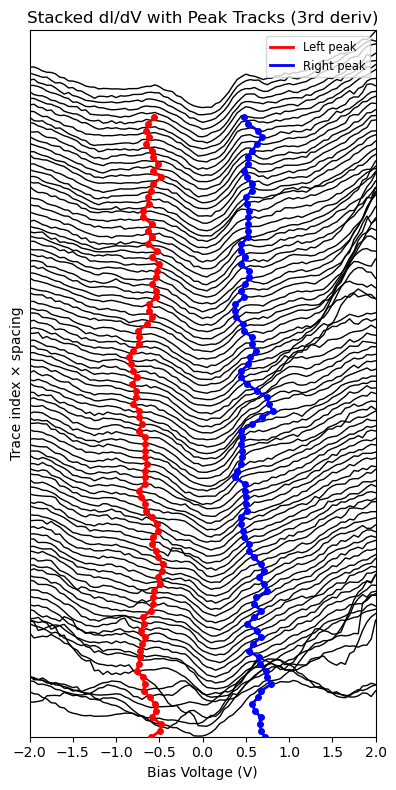

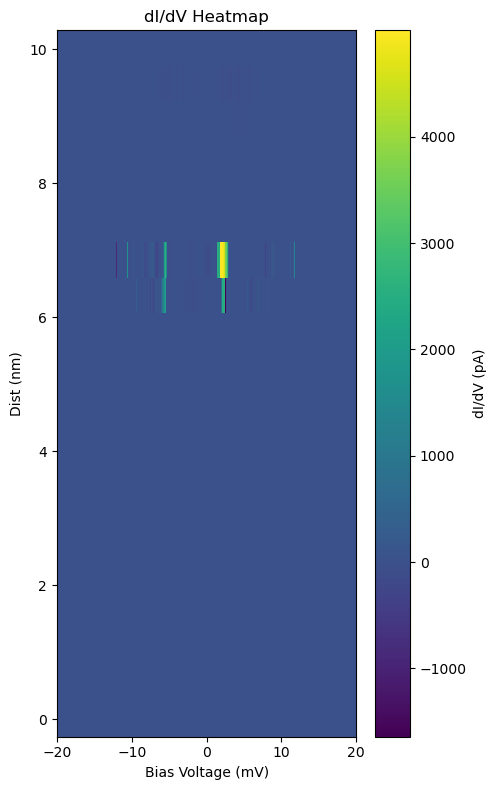

[ 0.          0.52734578  1.05469156  1.58203735  2.10938313  2.63672891
  3.16407469  3.69142048  4.21876626  4.74611204  5.27345782  5.80080361
  6.32814939  6.85549517  7.38284095  7.91018674  8.43753252  8.9648783
  9.49222408 10.01956987]


In [352]:
import rhkpy
import matplotlib.pyplot as plt

# 1. Load & average your data
specmap     = rhkpy.rhkdata('Scan__0060.sm4')
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # DataArray with dims ('bias', 'dist')

# 2. Extract coordinates for plotting
bias = dv.coords['bias'].values *10
dist = dv.coords['dist'].values

# 3. Prepare figure for heatmap
plt.figure(figsize=(5, 8))

# 4. Plot the heatmap: bias on x-axis, distance on y-axis
plt.pcolormesh(
    bias,
    dist,
    dv.values.T,    # transpose so that rows correspond to dist
    shading='auto'
)

# 5. Labeling
plt.xlabel('Bias Voltage (mV)')
plt.ylabel('Dist (nm)')
plt.title('dI/dV Heatmap')
plt.colorbar(label='dI/dV (pA)')

plt.tight_layout()
plt.show()

print(dist)

已保存分组平均热图到: Scan__0185/Scan__0185_grouped_avg_heatmap.png


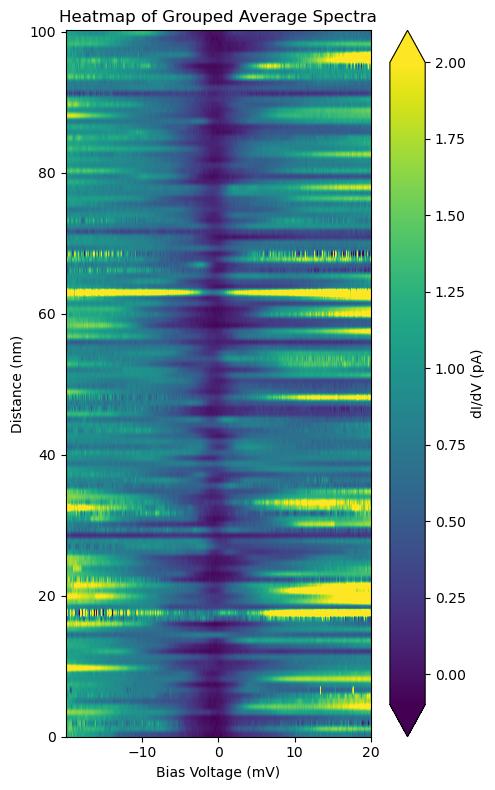

In [311]:
# 安装依赖（如尚未安装）：
# pip install rhkpy numpy matplotlib

import os
from pathlib import Path
import rhkpy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# —— 用户配置 —— 
filename   = 'Scan__0185.sm4'   # 你的 .sm4 文件
group_size = 5                  # 每组要平均的谱数量
vmin       = -0.1                # 热图色阶下限
vmax       = 2.0               # 热图色阶上限

# —— 1) 加载并平均原始光谱 —— 
specmap = rhkpy.rhkdata(filename)
da      = specmap.spectra['lia']                              # 使用 LIA 通道
da_avg  = da.mean(dim=['repetitions','biasscandir'])          # 平均掉重复和方向

# —— 2) 扁平化并分组平均 —— 
# 将 (bias, dist, reps, dir) → (scan, bias)
da_flat = (
    da
    .transpose('bias','dist','repetitions','biasscandir')
    .stack(scan=('dist','repetitions','biasscandir'))
    .transpose('scan','bias')
)

bias  = da_flat.coords['bias'].values * 10  # ±2 V → ±20 mV
data  = da_flat.values                      # shape = (80, n_bias)
total_scans, n_bias = data.shape

if total_scans % group_size != 0:
    raise ValueError(f"总扫描数 {total_scans} 不能被 group_size {group_size} 整除")
n_groups      = total_scans // group_size   # =16
data_grouped  = data.reshape(n_groups, group_size, n_bias).mean(axis=1)  # (16, n_bias)

# —— 3) 构造 y 轴：0 → 10 nm 均匀分布 16 点 —— 
dist_full = specmap.spectra['lia'].coords['dist'].values  # 原始 20 点，0→~10 nm
dist_min, dist_max = dist_full.min(), dist_full.max()    # 0 → ~10 nm
dist_grouped = np.linspace(dist_min, dist_max, n_groups) # 16 点

# —— 4) 绘制热图 —— 
fig, ax = plt.subplots(figsize=(5, 8))
norm = colors.Normalize(vmin=vmin, vmax=vmax, clip=True)

im = ax.imshow(
    data_grouped,
    origin='lower',
    aspect='auto',
    extent=[bias.min(), bias.max(), dist_min, dist_max],
    cmap='viridis',
    norm=norm
)

ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Distance (nm)')
ax.set_title('Heatmap of Grouped Average Spectra')

cbar = fig.colorbar(im, ax=ax, label='dI/dV (pA)', extend='both')
plt.tight_layout()

# —— 5) 保存 & 显示 —— 
outdir = Path(filename).stem
outdir = Path(outdir)
outdir.mkdir(exist_ok=True)
outpath = outdir / f'{Path(filename).stem}_grouped_avg_heatmap.png'
fig.savefig(outpath, dpi=300)
print(f"已保存分组平均热图到: {outpath}")

plt.show()


已保存：Scan__0051/Scan__0051_grouped_avg_heatmap.png


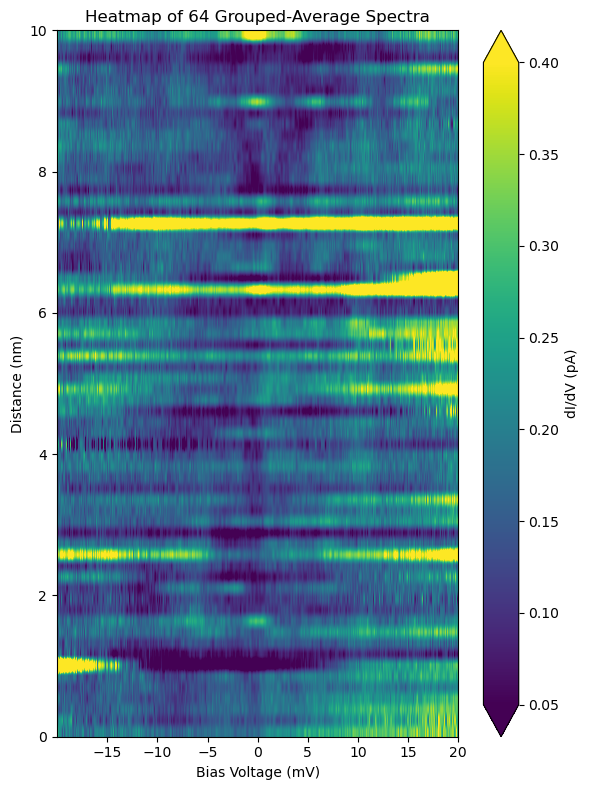

In [181]:
# 如果还没装：
# pip install rhkpy numpy matplotlib

import os
from pathlib import Path
import rhkpy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# —— 用户配置 —— 
filename    = 'Scan__0051.sm4'   # 你的 .sm4 文件
repetitions = 7                 # 明确告诉 rhkpy 这是 7 次重复
group_size  = 7                  # 每组聚合的曲线数（同 repetitions）
vmin        = 0.05               # 色阶下限
vmax        = 0.4               # 色阶上限

# —— 1) 强制按 7 次重复加载数据 —— 
specmap = rhkpy.rhkdata(filename, repetitions=repetitions)
da      = specmap.spectra['lia']   # 通道

# —— 2) 平均掉重复和方向 —— 
# （这里 biasscandir 通常=2；平均后只有 bias×dist）
da_avg  = da.mean(dim=['repetitions','biasscandir'])

# —— 3) 扁平化原始 80 条谱，并按 7 条分组平均 —— 
# flatten (bias, dist, reps, dir) → (scan, bias)
da_flat = (
    da
    .transpose('bias','dist','repetitions','biasscandir')
    .stack(scan=('dist','repetitions','biasscandir'))
    .transpose('scan','bias')
)
bias_mV, data_full = da_flat.coords['bias'].values * 1000/100, da_flat.values
total_scans, n_bias = data_full.shape
if total_scans % group_size:
    raise ValueError(f"总谱数 {total_scans} 不能被 group_size {group_size} 整除")
n_groups      = total_scans // group_size
data_grouped  = data_full.reshape(n_groups, group_size, n_bias).mean(axis=1)  # (16, n_bias)

# —— 4) 构造 0→10 nm 均匀的 y 轴 —— 
dist_min, dist_max = 0.0, 10.0
extent = [bias_mV.min(), bias_mV.max(), dist_min, dist_max]

# —— 5) 绘制热图 —— 
fig, ax = plt.subplots(figsize=(6, 8))
norm = colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
im = ax.imshow(
    data_grouped,
    origin='lower',
    aspect='auto',
    extent=extent,
    cmap='viridis',
    norm=norm
)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Distance (nm)')
ax.set_title(f'Heatmap of {n_groups} Grouped-Average Spectra')
cbar = fig.colorbar(im, ax=ax, label='dI/dV (pA)', extend='both')
plt.tight_layout()

# —— 6) 保存 & 显示 —— 
outdir = Path(filename).stem
os.makedirs(outdir, exist_ok=True)
outpath = Path(outdir) / f'{Path(filename).stem}_grouped_avg_heatmap.png'
fig.savefig(outpath, dpi=300)
print(f"已保存：{outpath}")
plt.show()


In [193]:
# 如果还没装：
# pip install rhkpy numpy matplotlib

import os
from pathlib import Path
import rhkpy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# —— 用户配置 —— 
filename    = 'Scan__0051.sm4'   # 你的 .sm4 文件
repetitions = 7                  # 明确告诉 rhkpy 这是 7 次重复
group_size  = 7                  # 每组聚合的曲线数（同 repetitions）
vmin        = 0.05               # 色阶下限
vmax        = 0.4                # 色阶上限

# —— 1) 强制按 repetitions 加载数据 —— 
specmap = rhkpy.rhkdata(filename, repetitions=repetitions)
da      = specmap.spectra['lia']   # LIA 通道

# —— 2) 平均掉重复和方向 —— 
da_avg = da.mean(dim=['repetitions', 'biasscandir'])  # 维度为 bias × dist

# —— 3) 展开所有谱，并按 group_size 分组平均 —— 
da_flat = (
    da
    .transpose('bias','dist','repetitions','biasscandir')
    .stack(scan=('dist','repetitions','biasscandir'))
    .transpose('scan','bias')
)
bias_mV     = da_flat.coords['bias'].values * 1000 / 100  # 转换为 mV
data_full   = da_flat.values                              # shape = (n_scan, n_bias)
total_scans = data_full.shape[0]
n_bias      = data_full.shape[1]

if total_scans % group_size:
    raise ValueError(f"总谱数 {total_scans} 不能被 group_size {group_size} 整除")

n_groups     = total_scans // group_size
data_grouped = data_full.reshape(n_groups, group_size, n_bias).mean(axis=1)  # shape = (n_groups, n_bias)

# —— 4) 自动读取实际的 dist 距离 —— 
dist_vals = da_avg.coords['dist'].values
if len(dist_vals) != n_groups:
    raise ValueError(f"分组后谱数 {n_groups} 与 dist 轴长度 {len(dist_vals)} 不一致，请检查 repetitions 设置")

dist_min, dist_max = dist_vals.min(), dist_vals.max()
extent = [bias_mV.min(), bias_mV.max(), dist_min, dist_max]

# —— 5) 绘图 —— 
fig, ax = plt.subplots(figsize=(6, 8))
norm = colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
im = ax.imshow(
    data_grouped,
    origin='lower',
    aspect='auto',
    extent=extent,
    cmap='viridis',
    norm=norm
)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Distance (nm)')
ax.set_title(f'Heatmap of {n_groups} Grouped-Average Spectra')
cbar = fig.colorbar(im, ax=ax, label='dI/dV (a.u.)', extend='both')
plt.tight_layout()

# —— 6) 保存 —— 
outdir = Path(filename).stem
os.makedirs(outdir, exist_ok=True)
outpath = Path(outdir) / f'{Path(filename).stem}_grouped_avg_heatmap.png'
fig.savefig(outpath, dpi=300)
print(f"✅ 已保存：{outpath}")
plt.show()


ValueError: 分组后谱数 64 与 dist 轴长度 32 不一致，请检查 repetitions 设置

Saved averaged spectrum to Scan__0149/Scan__0149_average_spectrum.png


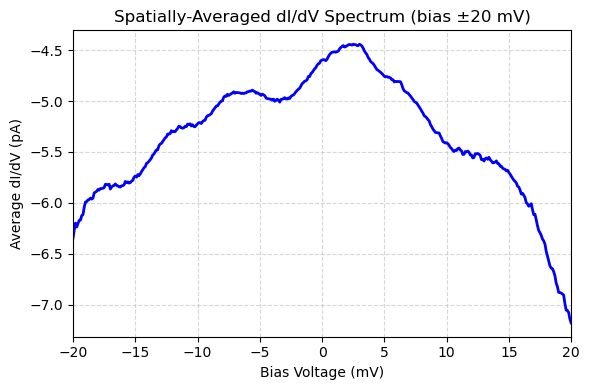

In [281]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt

# 1. Specify input file and output folder
filename = 'Scan__0149.sm4'
base = Path(filename).stem           # "Scan__0072"
outdir = Path(base)
outdir.mkdir(exist_ok=True)

# 2. Load & average your data
specmap     = rhkpy.rhkdata(filename,repetitions=4)
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']    # DataArray with dims ('bias','dist')

# 3. Compute the spatially-averaged spectrum
avg_spec = dv.mean(dim='dist')      # dims=('bias',)

# 4. Convert bias to mV with 1/100 divider (±2 V → ±20 mV)
bias_mV = avg_spec.coords['bias'].values * 1000 / 100

# 5. Plot the averaged spectrum in the ±20 mV range
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(bias_mV, avg_spec.values, color='blue', linewidth=2)
ax.set_xlabel('Bias Voltage (mV)')
ax.set_ylabel('Average dI/dV (pA)')
ax.set_title('Spatially-Averaged dI/dV Spectrum (bias ±20 mV)')
ax.set_xlim(-20, 20)
ax.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# 6. Save the figure with suffix "_average"
outpath = outdir / f'{base}_average_spectrum.png'
fig.savefig(outpath, dpi=300)
print(f"Saved averaged spectrum to {outpath}")

# 7. Display inline
plt.show()


Saved averaged spectrum to Scan__0014/Scan__0014_average_spectrum.png


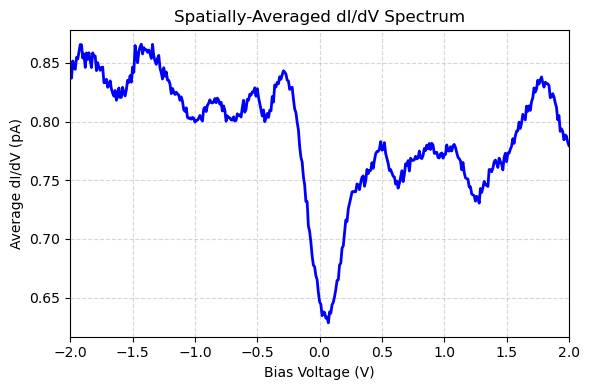

In [15]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt

# 1. Specify input file and output folder
filename = 'Scan__0014.sm4'
base = Path(filename).stem              # "Scan__0072"
outdir = Path(base)
outdir.mkdir(exist_ok=True)

# 2. Load & average your data
specmap     = rhkpy.rhkdata(filename)
specmap_avg = specmap.spectra.mean(dim=['repetitions', 'biasscandir'])
dv          = specmap_avg['lia']       # DataArray with dims ('bias','dist')

# 3. Compute the spatially-averaged spectrum
avg_spec = dv.mean(dim='dist')         # dims=('bias',)

# 4. Extract bias values
bias = avg_spec.coords['bias'].values  # in V

# 5. Plot the averaged spectrum
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(bias, avg_spec.values, color='blue', linewidth=2)
ax.set_xlabel('Bias Voltage (V)')
ax.set_ylabel('Average dI/dV (pA)')
ax.set_title('Spatially-Averaged dI/dV Spectrum')
ax.set_xlim(-2.0, 2.0)
ax.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# 6. Save the figure with suffix "_average"
outpath = outdir / f'{base}_average_spectrum.png'
fig.savefig(outpath, dpi=300)
print(f"Saved averaged spectrum to {outpath}")

# 7. Display inline
plt.show()


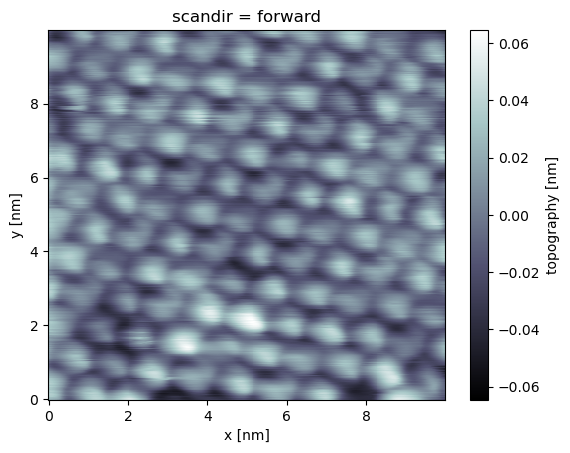

In [11]:
import rhkpy
import matplotlib.pyplot as plt

# 1. Load & average your data
specmap = rhkpy.rhkdata('Scan__0070.sm4')
fwscan = specmap.image.sel(scandir = 'forward')
fwscan['topography'].plot(cmap = 'bone')

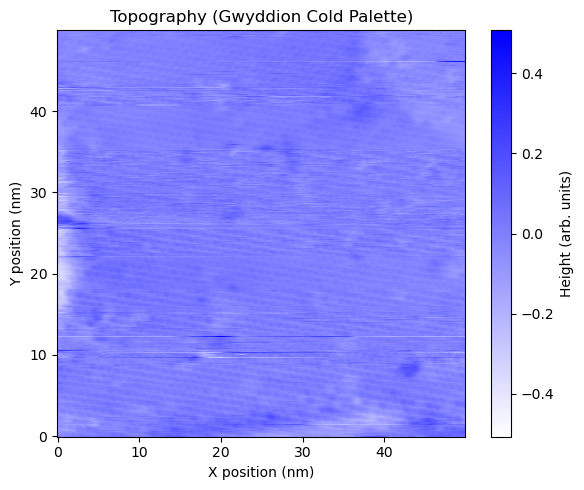

In [119]:
import rhkpy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# 1. Load the SM4 file and select forward-scan topography
specmap = rhkpy.rhkdata('Scan__0068.sm4')
fwscan = specmap.image.sel(scandir='forward')
topo = fwscan['topography']

# 2. Create a custom "cold" colormap (white → blue) like Gwyddion's
gwyddion_cold = LinearSegmentedColormap.from_list(
    'gwyddion_cold',
    ['#FFFFFF', '#0000FF'],  # white to blue
    N=256
)

# 3. Plot the topography using the cold palette
plt.figure(figsize=(6, 5))
im = topo.plot(
    cmap=gwyddion_cold,
    cbar_kwargs={'label': 'Height (arb. units)'}
)

# 4. Add titles and labels
plt.title('Topography (Gwyddion Cold Palette)')
plt.xlabel('X position (nm)')
plt.ylabel('Y position (nm)')
plt.tight_layout()
plt.show()


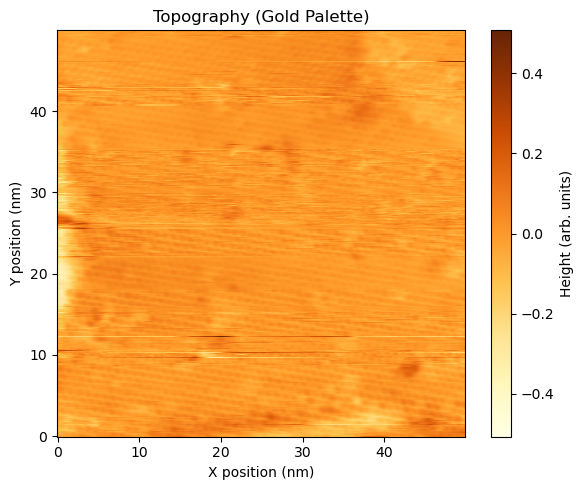

In [117]:
import rhkpy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# 1. Load the SM4 file and select forward-scan topography
specmap = rhkpy.rhkdata('Scan__0068.sm4')
fwscan = specmap.image.sel(scandir='forward')
topo = fwscan['topography']

# OPTION A: Use built-in "YlOrBr" (yellow→orange→brown)
cmap_gold = 'YlOrBr'

# OPTION B: Create a custom white→gold gradient
# cmap_gold = LinearSegmentedColormap.from_list(
#     'custom_gold',
#     ['#FFFFFF', '#FFD700'],  # white -> gold
#     N=256
# )

# 2. Plot with the golden palette
plt.figure(figsize=(6, 5))
topo.plot(
    cmap=cmap_gold,
    cbar_kwargs={'label': 'Height (arb. units)'}
)

# 3. Add titles and labels
plt.title('Topography (Gold Palette)')
plt.xlabel('X position (nm)')
plt.ylabel('Y position (nm)')
plt.tight_layout()
plt.show()


Saved cold-palette topography to Scan__0068/topography_Scan__0068_cold.png


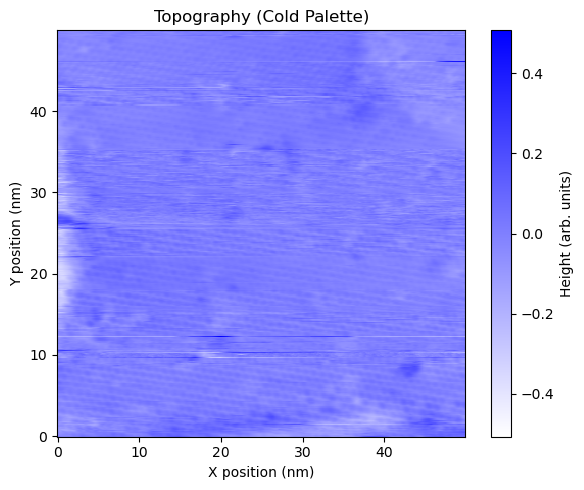

In [129]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# --- 0. Specify your input file here ---
filename = 'Scan__0068.sm4'

# --- 1. Prepare output directory ---
base = Path(filename).stem               # e.g. "Scan__0068"
outdir = Path(base)
if outdir.exists():
    # clear out old files
    for f in outdir.iterdir():
        f.unlink()
else:
    outdir.mkdir()

# --- 2. Load & select topography ---
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']

# --- 3. Build a “cold” colormap ---
gwyddion_cold = LinearSegmentedColormap.from_list(
    'gwyddion_cold',
    ['#FFFFFF', '#0000FF'],  # white → blue
    N=256
)

# --- 4. Plot ---
fig, ax = plt.subplots(figsize=(6, 5))
im = topo.plot(
    ax=ax,
    cmap=gwyddion_cold,
    cbar_kwargs={'label': 'Height (arb. units)'}
)
ax.set_title('Topography (Cold Palette)')
ax.set_xlabel('X position (nm)')
ax.set_ylabel('Y position (nm)')
plt.tight_layout()

# --- 5. Save to file with suffix ---
cold_outpath = outdir / f'topography_{base}_cold.png'
fig.savefig(cold_outpath, dpi=300)
print(f"Saved cold-palette topography to {cold_outpath}")

# --- 6. Display inline ---
plt.show()


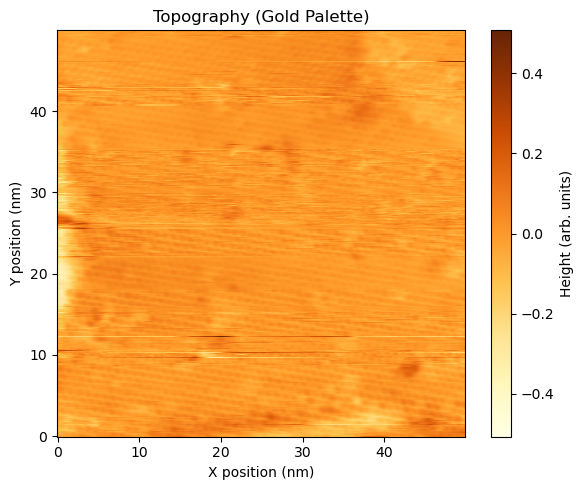

Saved gold-palette topography to Scan__0068/topography_Scan__0068_gold.png


In [131]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt

# --- 0. Specify your input file here ---
filename = 'Scan__0068.sm4'
base = Path(filename).stem             # "Scan__0068"
outdir = Path(base)

# --- 1. Prepare (or clear) the output directory ---
if outdir.exists():
    for f in outdir.iterdir():
        f.unlink()
else:
    outdir.mkdir()

# --- 2. Load & select forward-scan topography ---
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']

# --- 3. Define the gold colormap (built-in) ---
cmap_gold = 'YlOrBr'  # yellow→orange→brown

# --- 4. Plot, save, and display the gold version ---
fig, ax = plt.subplots(figsize=(6, 5))
topo.plot(
    ax=ax,
    cmap=cmap_gold,
    cbar_kwargs={'label': 'Height (arb. units)'}
)
ax.set_title('Topography (Gold Palette)')
ax.set_xlabel('X position (nm)')
ax.set_ylabel('Y position (nm)')
plt.tight_layout()

# Save to file with suffix
outpath = outdir / f'topography_{base}_gold.png'
fig.savefig(outpath, dpi=300)
plt.show()

print(f"Saved gold-palette topography to {outpath}")


Saved: Scan__0089/topography_Scan__0089_cold.png


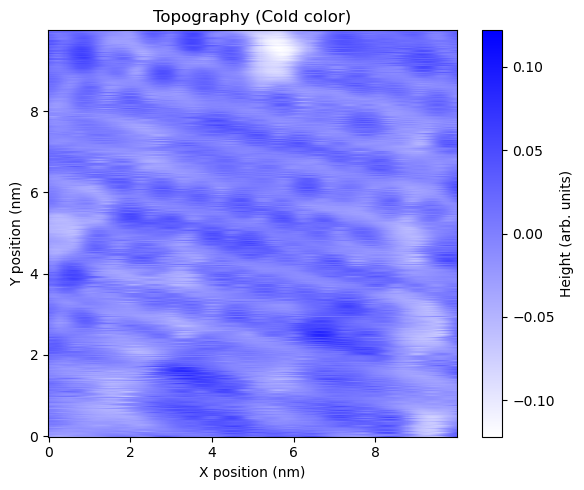

Saved: Scan__0089/topography_Scan__0089_gold.png


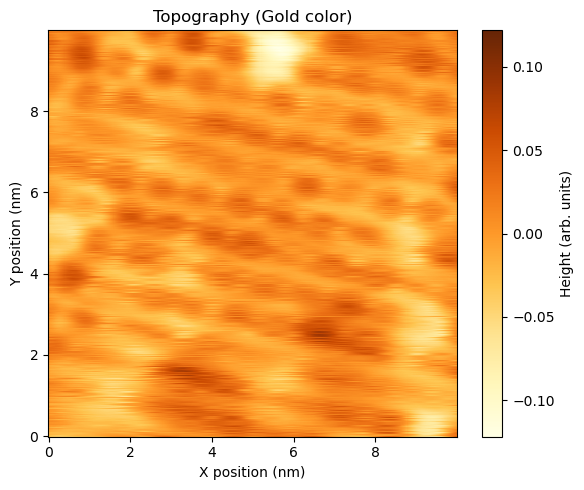

In [159]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# --- 0. Specify your input file here ---
filename = 'Scan__0089.sm4'
base = Path(filename).stem             # e.g. "Scan__0068"
outdir = Path(base)

# --- 1. Prepare (or clear) the output directory ---
if outdir.exists():
    for f in outdir.iterdir():
        f.unlink()
else:
    outdir.mkdir()

# --- 2. Load & select forward-scan topography ---
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']

# --- 3. Define colormaps ---
# Cold palette: white → blue
cmap_cold = LinearSegmentedColormap.from_list(
    'gwyddion_cold',
    ['#FFFFFF', '#0000FF'],  # white → blue
    N=256
)
# Gold palette: yellow → orange → brown (built-in)
cmap_gold = 'YlOrBr'

# --- 4. Plot, save, and display both palettes ---
for suffix, cmap in [('cold', cmap_cold), ('gold', cmap_gold)]:
    fig, ax = plt.subplots(figsize=(6, 5))
    topo.plot(
        ax=ax,
        cmap=cmap,
        cbar_kwargs={'label': 'Height (arb. units)'}
    )
    ax.set_title(f'Topography ({suffix.capitalize()} color)')
    ax.set_xlabel('X position (nm)')
    ax.set_ylabel('Y position (nm)')
    plt.tight_layout()
    
    # Save to file with suffix
    outpath = outdir / f'topography_{base}_{suffix}.png'
    fig.savefig(outpath, dpi=300)
    print(f"Saved: {outpath}")
    
    # Display inline
    plt.show()


Saved: Scan__0000/topography_Scan__0000_cold.png


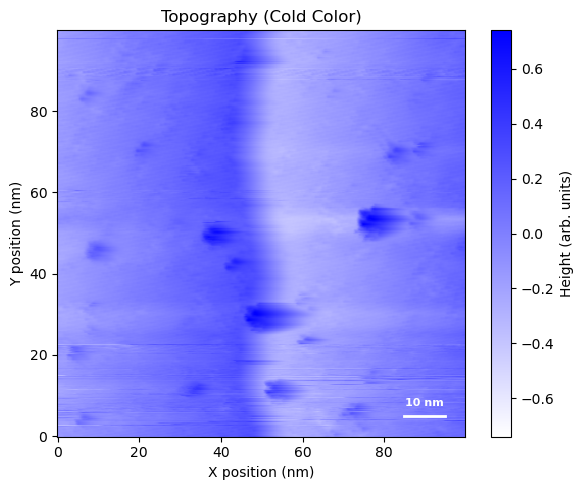

Saved: Scan__0000/topography_Scan__0000_gold.png


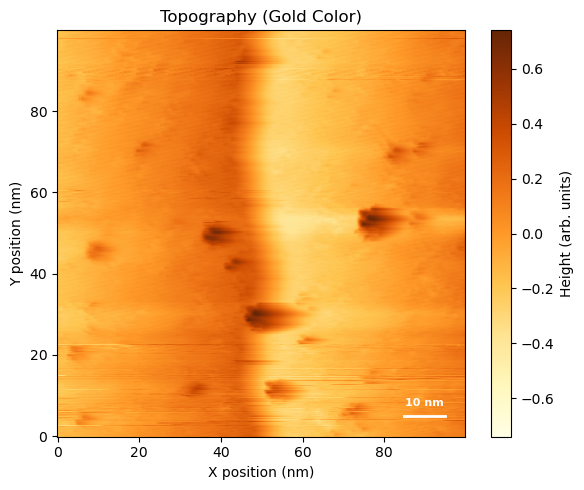

In [49]:
import os
from pathlib import Path
import rhkpy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# --- 0. Specify your input file here ---
filename = 'Scan__0000.sm4'
base = Path(filename).stem             # e.g. "Scan__0068"
outdir = Path(base)

# --- 1. Prepare (or clear) the output directory ---
if outdir.exists():
    for f in outdir.iterdir():
        f.unlink()
else:
    outdir.mkdir()

# --- 2. Load & select forward-scan topography ---
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']

# --- 3. Define colormaps ---
cmap_cold = LinearSegmentedColormap.from_list('gwyddion_cold', ['#FFFFFF', '#0000FF'], N=256)
cmap_gold = 'YlOrBr'

def plot_with_scalebar(cmap, suffix):
    # 4. Create figure
    fig, ax = plt.subplots(figsize=(6, 5))
    topo.plot(ax=ax, cmap=cmap, cbar_kwargs={'label': 'Height (arb. units)'})
    
    # 5. Determine spatial extents (in nm)
    x = topo.coords['x'].values
    y = topo.coords['y'].values
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    
    # 6. Compute scale bar: 10% of image width
    bar_length = (x_max - x_min) * 0.1  # in nm
    margin_x = (x_max - x_min) * 0.05
    margin_y = (y_max - y_min) * 0.05
    bar_x_start = x_max - bar_length - margin_x
    bar_y = y_min + margin_y
    
    # 7. Draw white scale bar
    ax.plot(
        [bar_x_start, bar_x_start + bar_length],
        [bar_y, bar_y],
        color='white',
        linewidth=2
    )
    
    # 8. Label the scale bar with its physical length
    ax.text(
        bar_x_start + bar_length/2,
        bar_y + (y_max - y_min)*0.02,  # slightly above the bar
        f'{bar_length:.0f} nm',
        color='white',
        ha='center',
        va='bottom',
        fontsize=8,
        weight='bold'
    )
    
    # 9. Final touches
    ax.set_title(f'Topography ({suffix.capitalize()} Color)')
    ax.set_xlabel('X position (nm)')
    ax.set_ylabel('Y position (nm)')
    plt.tight_layout()
    
    # 10. Save and show
    outpath = outdir / f'topography_{base}_{suffix}.png'
    fig.savefig(outpath, dpi=300)
    print(f"Saved: {outpath}")
    plt.show()

# --- 11. Generate both images ---
plot_with_scalebar(cmap_cold, 'cold')
plot_with_scalebar(cmap_gold, 'gold')


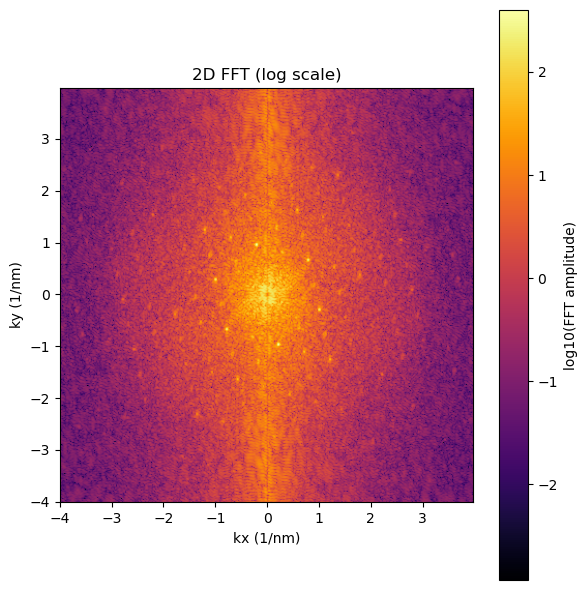

✅ FFT 图像已保存为: Scan__0091/Scan__0091_fft_log.png


In [23]:
# 如果还未安装：
# !pip install rhkpy numpy matplotlib scipy scikit-image

import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift
from scipy.ndimage import gaussian_filter
from scipy.signal import windows
from pathlib import Path
import rhkpy

# === 1. 文件路径 ===
filename = 'Scan__0091.sm4'
base = Path(filename).stem
outdir = Path(base)
outdir.mkdir(exist_ok=True)

# === 2. 加载 Topography 图像 ===
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']
topo_vals = topo.values

# === 3. 背景去除 + Hanning Window ===
topo_detrended = topo_vals - gaussian_filter(topo_vals, sigma=15)  # 去除大尺度背景
win_x = windows.hann(topo_vals.shape[1])
win_y = windows.hann(topo_vals.shape[0])
window = np.outer(win_y, win_x)
topo_windowed = topo_detrended * window

# === 4. 执行 FFT ===
fft_data = fftshift(np.abs(fft2(topo_windowed)))

# === 5. 构造 kx, ky 轴 ===
nx, ny = topo.shape
x_nm = topo.coords['x'].values
y_nm = topo.coords['y'].values
dx = (x_nm[-1] - x_nm[0]) / (nx - 1)
dy = (y_nm[-1] - y_nm[0]) / (ny - 1)
kx = np.fft.fftshift(np.fft.fftfreq(nx, d=dx))
ky = np.fft.fftshift(np.fft.fftfreq(ny, d=dy))

# === 6. 绘制 FFT（对数强度） ===
fig, ax = plt.subplots(figsize=(6, 6))
extent = [kx.min(), kx.max(), ky.min(), ky.max()]
fft_log = np.log10(fft_data + 1e-3)  # log scale to enhance weak peaks
im = ax.imshow(fft_log, extent=extent, origin='lower', cmap='inferno')
ax.set_xlabel('kx (1/nm)')
ax.set_ylabel('ky (1/nm)')
ax.set_title('2D FFT (log scale)')
plt.colorbar(im, ax=ax, label='log10(FFT amplitude)')
plt.tight_layout()

# === 7. 保存结果 ===
outpath = outdir / f'{base}_fft_log.png'
fig.savefig(outpath, dpi=300)
plt.show()
print(f"✅ FFT 图像已保存为: {outpath}")


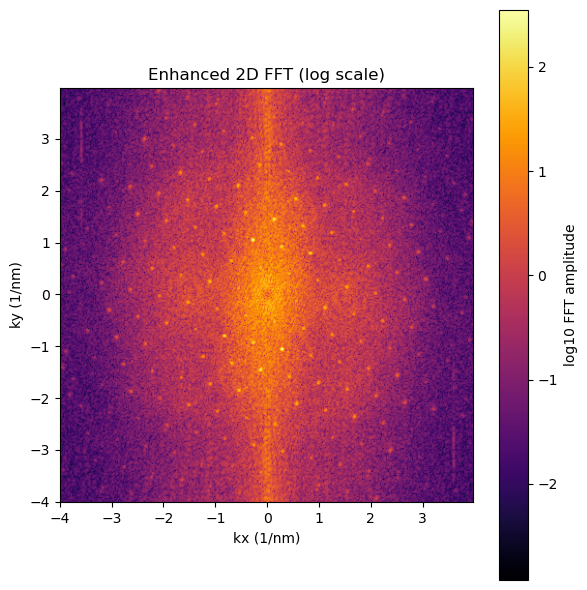

✅ 增强型 FFT 图已保存为: Scan__0146/Scan__0146_fft_enhanced.png


In [7]:
# 如果还未安装：
# !pip install rhkpy numpy matplotlib scipy

import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift
from scipy.ndimage import gaussian_filter
from scipy.signal import windows
from pathlib import Path
import rhkpy

# === 1. 文件设置 ===
filename = 'Scan__0146.sm4'
base = Path(filename).stem
outdir = Path(base)
outdir.mkdir(exist_ok=True)

# === 2. 加载 Topography ===
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']
topo_vals = topo.values

# === 3. 去背景 & 加 Hann 窗口 ===
# 去除大尺度背景
topo_detrended = topo_vals - gaussian_filter(topo_vals, sigma=15)

# 应用 Hann 窗口减少边缘效应
win_x = windows.hann(topo_vals.shape[1])
win_y = windows.hann(topo_vals.shape[0])
window = np.outer(win_y, win_x)
topo_windowed = topo_detrended * window

# === 4. FFT ===
fft_data = fftshift(np.abs(fft2(topo_windowed)))
fft_log  = np.log10(fft_data + 1e-3)  # 对数强度增强弱峰

# === 5. kx, ky 轴 (单位 1/nm) ===
nx, ny = topo.shape
x_nm = topo.coords['x'].values
y_nm = topo.coords['y'].values
dx = (x_nm[-1] - x_nm[0]) / (nx - 1)
dy = (y_nm[-1] - y_nm[0]) / (ny - 1)
kx = np.fft.fftshift(np.fft.fftfreq(nx, d=dx))
ky = np.fft.fftshift(np.fft.fftfreq(ny, d=dy))
extent = [kx.min(), kx.max(), ky.min(), ky.max()]

# === 6. 绘制 & 保存 ===
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(fft_log, extent=extent, origin='lower', cmap='inferno')
ax.set_xlabel('kx (1/nm)')
ax.set_ylabel('ky (1/nm)')
ax.set_title('Enhanced 2D FFT (log scale)')
plt.colorbar(im, ax=ax, label='log10 FFT amplitude')
plt.tight_layout()

outpath = outdir / f'{base}_fft_enhanced.png'
fig.savefig(outpath, dpi=300)
plt.show()
print(f"✅ 增强型 FFT 图已保存为: {outpath}")


理论布拉格点位置 (理论) ：[[-7.85398163e+00 -1.36034952e+01]
 [-1.57079633e+01  1.77635684e-15]
 [-4.44089210e-15 -2.72069905e+01]
 [ 0.00000000e+00  0.00000000e+00]
 [-7.85398163e+00  1.36034952e+01]
 [ 7.85398163e+00 -1.36034952e+01]
 [ 7.85398163e+00  1.36034952e+01]
 [ 4.44089210e-15  2.72069905e+01]
 [ 1.57079633e+01 -1.77635684e-15]]
检测到的布拉格点位置 (检测到) ：[[-4.00000011 -4.00000011]
 [-4.00000011  0.        ]
 [ 0.         -4.00000011]
 [ 0.          0.        ]
 [-4.00000011  3.98000011]
 [ 3.98000011 -4.00000011]
 [ 3.98000011  3.98000011]
 [ 0.          3.98000011]
 [ 3.98000011  0.        ]]
通过布拉格峰计算得到的真实晶格常数：1.468 nm


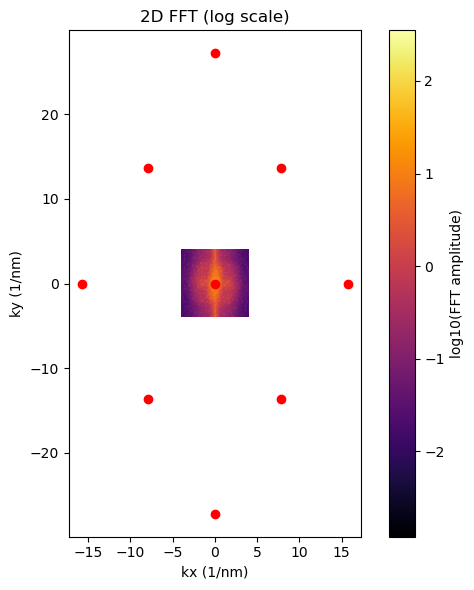

✅ FFT 图像已保存为: Scan__0146/Scan__0146_fft_log_with_braggs.png


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift
from scipy.ndimage import gaussian_filter
from scipy.signal import windows
from pathlib import Path
import rhkpy

# === 1. 文件路径 ===
filename = 'Scan__0146.sm4'
base = Path(filename).stem
outdir = Path(base)
outdir.mkdir(exist_ok=True)

# === 2. 加载 Topography 图像 ===
specmap = rhkpy.rhkdata(filename)
fwscan  = specmap.image.sel(scandir='forward')
topo    = fwscan['topography']
topo_vals = topo.values

# === 3. 背景去除 + Hanning Window ===
topo_detrended = topo_vals - gaussian_filter(topo_vals, sigma=15)  # 去除大尺度背景
win_x = windows.hann(topo_vals.shape[1])
win_y = windows.hann(topo_vals.shape[0])
window = np.outer(win_y, win_x)
topo_windowed = topo_detrended * window

# === 4. 执行 FFT ===
fft_data = fftshift(np.abs(fft2(topo_windowed)))

# === 5. 构造 kx, ky 轴 ===
nx, ny = topo.shape
x_nm = topo.coords['x'].values
y_nm = topo.coords['y'].values
dx = (x_nm[-1] - x_nm[0]) / (nx - 1)
dy = (y_nm[-1] - y_nm[0]) / (ny - 1)
kx = np.fft.fftshift(np.fft.fftfreq(nx, d=dx))
ky = np.fft.fftshift(np.fft.fftfreq(ny, d=dy))

# === 6. 给定晶格常数和晶体结构 ===
# 假设为六角形晶格（可以根据需求更改）
a = 0.4  # 晶格常数 (单位：nm)
c = 1.0  # 轴常数 (单位：nm)

# 计算六角晶格的倒易空间（Bragg points）
# 对于六角晶格，理论布拉格点可以通过以下公式计算：
# Qx = (m*2π/a) * cos(θ) + (n*2π/a) * cos(θ+π/3)
# Qy = (m*2π/a) * sin(θ) + (n*2π/a) * sin(θ+π/3)

# 假设我们计算前几个布拉格点
m_values = np.array([-1, 0, 1])
n_values = np.array([0, 1, -1])
theta = np.pi / 3  # 六角晶格的角度

theoretical_braggs = []

for m in m_values:
    for n in n_values:
        Qx = (m * 2 * np.pi / a) * np.cos(theta) + (n * 2 * np.pi / a) * np.cos(theta + np.pi / 3)
        Qy = (m * 2 * np.pi / a) * np.sin(theta) + (n * 2 * np.pi / a) * np.sin(theta + np.pi / 3)
        theoretical_braggs.append([Qx, Qy])

theoretical_braggs = np.array(theoretical_braggs)

# === 7. 绘制 FFT（对数强度）并标记布拉格峰 ===
fig, ax = plt.subplots(figsize=(6, 6))
extent = [kx.min(), kx.max(), ky.min(), ky.max()]
fft_log = np.log10(fft_data + 1e-3)  # log scale to enhance weak peaks
im = ax.imshow(fft_log, extent=extent, origin='lower', cmap='inferno')
ax.set_xlabel('kx (1/nm)')
ax.set_ylabel('ky (1/nm)')
ax.set_title('2D FFT (log scale)')

# 标记理论布拉格峰
for bragg in theoretical_braggs:
    ax.plot(bragg[0], bragg[1], 'ro', label="Theoretical Bragg Peaks" if bragg is theoretical_braggs[0] else "")

plt.colorbar(im, ax=ax, label='log10(FFT amplitude)')
plt.tight_layout()

# === 8. 计算真实的晶格常数 ===
# 通过FFT图像的布拉格峰位置来估算真实的晶格常数
# 寻找FFT图像中最接近理论布拉格峰的点
detected_braggs = []

for bragg in theoretical_braggs:
    # 找到最近的FFT点
    closest_kx_idx = np.argmin(np.abs(kx - bragg[0]))
    closest_ky_idx = np.argmin(np.abs(ky - bragg[1]))
    detected_braggs.append([kx[closest_kx_idx], ky[closest_ky_idx]])

detected_braggs = np.array(detected_braggs)

# 假设第一个布拉格峰的k值就是基准，可以计算真实的晶格常数
real_a = 2 * np.pi / np.mean(np.linalg.norm(detected_braggs, axis=1))

# 输出计算的结果
print(f"理论布拉格点位置 (理论) ：{theoretical_braggs}")
print(f"检测到的布拉格点位置 (检测到) ：{detected_braggs}")
print(f"通过布拉格峰计算得到的真实晶格常数：{real_a:.3f} nm")

# === 9. 保存结果 ===
outpath = outdir / f'{base}_fft_log_with_braggs.png'
fig.savefig(outpath, dpi=300)
plt.show()
print(f"✅ FFT 图像已保存为: {outpath}")
